# Investigate CO2 per capita emissions

In [2]:
import numpy as np
import pandas as pd
import pprint as pp

import matplotlib.pyplot as plt
%matplotlib inline

# to use seaborn styling in matplotlib plots
import seaborn as sns
sns.set()

# to display offline interactive plots
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# cufflines binds plotly to pandas DFs
import cufflinks as cf
import plotly.tools as tls

# to scale heatmaps
from sklearn import preprocessing

tls.embed('https://plot.ly/~cufflinks/8')
cf.set_config_file(offline=True, world_readable=False, theme='ggplot')

# Why look at CO2?

In case you've been hiding under a rock, the climate is a-changing.

From https://climate.nasa.gov/vital-signs/global-temperature/ :

_"This graph illustrates the change in global surface temperature **relative to 1951-1980 average temperatures**. Seventeen of the 18 warmest years in the 136-year record all have occurred since 2001, with the exception of 1998. **The year 2016 ranks as the warmest on record**. (Source: NASA/GISS)."_ (Emphasis mine)

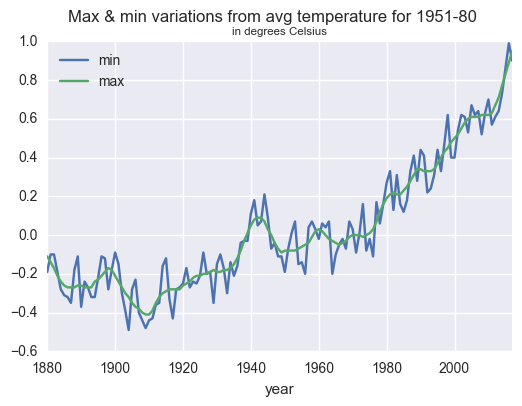

In [512]:
# load historical temperature data

url = 'https://climate.nasa.gov/system/internal_resources/details/original/647_Global_Temperature_Data_File.txt'
temps = pd.read_csv(url, sep= '\t', header=None)

temps.rename(columns={0:'year', 1:'min', 2:'max'}, inplace=True)
temps.set_index('year', inplace=True)

temps.plot()
plt.suptitle('Max & min variations from avg temperature for 1951-80')
plt.title('in degrees Celsius', fontsize='x-small');

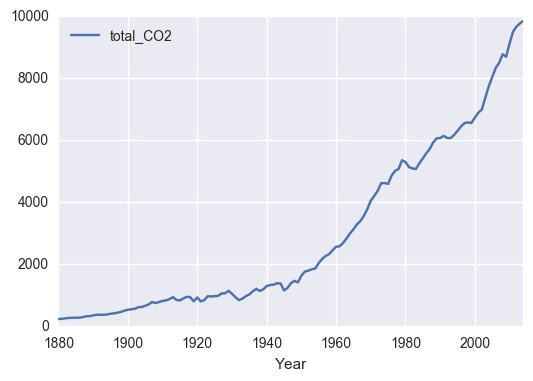

In [513]:
# Compare with global CO2

# Global state of CO2
url = 'http://cdiac.ess-dive.lbl.gov/ftp/ndp030/CSV-FILES/global.1751_2014.csv'
df = pd.read_csv(url)
df.drop(0, inplace=True)
df = df.iloc[:,0:2].astype(int).set_index('Year')
colname = df.columns[0]
df.rename(columns = {colname:'total_CO2'}, inplace=True)

# plot same for same timeframe as temp data
df.loc[1880:].plot();

# Load per capita CO2 data

In [71]:
mypath = 'data/final/'

filename = 'final_df.csv'
df = pd.read_csv(mypath + filename)

# assign name attribute to df
df.name = filename.split('_')[0]
df.head()

,country,region,sub-region,year,CO2_pc,energy_use_pc,hdi,income_pc,motor_vehicles_per_1000,population,roads_paved_%,sulfur_emissions_pc_kg,surviving_kids_per_woman
0,Afghanistan,Asia,Southern Asia,1949,0.00182,NaN,NaN,1030.0,NaN,NaN,NaN,0.0477,NaN
1,Afghanistan,Asia,Southern Asia,1950,0.01088,NaN,NaN,1040.0,NaN,7752118.0,NaN,0.0758,2.89
2,Afghanistan,Asia,Southern Asia,1951,0.01169,NaN,NaN,1060.0,NaN,7839426.0,NaN,0.0932,2.89
3,Afghanistan,Asia,Southern Asia,1952,0.01155,NaN,NaN,1070.0,NaN,7934798.0,NaN,0.1100,3.02
4,Afghanistan,Asia,Southern Asia,1953,0.01323,NaN,NaN,1120.0,NaN,8038312.0,NaN,0.1260,3.02


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 13 columns):
country                     17055 non-null object
region                      17055 non-null object
sub-region                  17055 non-null object
year                        17055 non-null int64
CO2_pc                      17055 non-null float64
energy_use_pc               5324 non-null float64
hdi                         3898 non-null float64
income_pc                   14969 non-null float64
motor_vehicles_per_1000     456 non-null float64
population                  12517 non-null float64
roads_paved_%               1977 non-null float64
sulfur_emissions_pc_kg      11230 non-null float64
surviving_kids_per_woman    13919 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.7+ MB


In [72]:
# for now, just focus on CO2 values
val = 'CO2_pc'
co2_df = df.iloc[:,:5]
co2_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 5 columns):
country       17055 non-null object
region        17055 non-null object
sub-region    17055 non-null object
year          17055 non-null int64
CO2_pc        17055 non-null float64
dtypes: float64(1), int64(1), object(3)
memory usage: 666.3+ KB


In [74]:
# assign name attr, for later use in plot titles
co2_df.name = 'CO2'

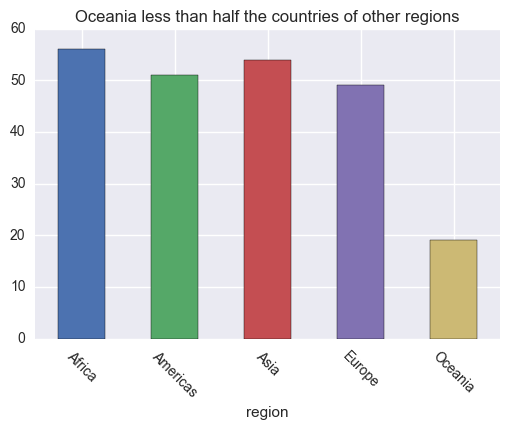

In [584]:
# How many countries in each region?
co2_df.groupby('region')['country'].nunique().plot(kind='bar', rot=-45)
plt.title('Oceania less than half the countries of other regions');

In [583]:
# country counts by region
co2_df.groupby(['region'])['country'].nunique().sort_values()

region
Oceania     19
Europe      49
Americas    51
Asia        54
Africa      56
Name: country, dtype: int64

# Helper Functions

In [4]:
# Create x, where x the 'scores' column's values as floats
#x = df[['score']].values.astype(float)

# Create a minimum and maximum processor object
#min_max_scaler = preprocessing.MinMaxScaler()

# Create an object to transform the data to fit minmax processor
#x_scaled = min_max_scaler.fit_transform(x)

In [7]:
def assign_name(row):
    df = row['df']
    df.name = row['labels']
    
def facetize_df(df, facet):
    """
    Splits df into list of smaller dfs for each categorical value
    """
    facet_dfs = [df.loc[df[facet]==f] for f in df[facet].unique()]
    facet_list = [f for f in df[facet].unique()]
    
    facet_dfs = pd.DataFrame({'df': facet_dfs, 'labels': facet_list})
    
    #facet_dfs = facet_dfs.apply(assign_name, axis=1)
    return facet_dfs


### Plotly

In [9]:
# refactored
def plotly_line2(df, val):
    name = df.name
    df = df.pivot('year', 'country', val)
    fig = df.iplot(asFigure = True,\
                    title = " ".join([val,name]),\
                    yTitle = str.title('%s in metric tonnes' % val),\
                    theme = 'ggplot')
    
    return fig

def plotly_timeseries(df, value):
    fig = plotly_line2(df, value)
    py.offline.iplot(fig)
    
    
def plot_facet_timeseries(df, facet, val):
    #df_list = facetize_df(df, facet)
    #pd.Series(df_list).apply(plotly_timeseries, args=[val])
    for f in df[facet].unique():
        facet_df = df.loc[df[facet]==f]
        facet_df.name = f
        plotly_timeseries(facet_df, val)


In [10]:
# create category levels for a column
def cut_column(df, col):
    level = pd.qcut(df[col].fillna(0), 4, \
                  duplicateds = 'drop', \
                   labels = ['1 low %s' % col, '2 med %s' % col, '3 high %s' % col, '4 very high %s' % col])
    df[col] = level
    return df

# generic bubble plot, categorized by region
def plot_bubble(df, col, cut_by):
    #categories = cut_by
    df.iplot(kind='bubble', x=x, y=y, size=size, text='country',\
           xTitle=str.title(x), yTitle=y, categories=cut_by, \
             title= '%s vs %s for %s (%s)' % (x.upper(), y.upper(), q.upper(), yr))

# bubble plot with, categorized by 'col' levels
def plot_bubble_with_cuts(df, col, cut_by='region'):
    if cut_by:
        cut_df = cut_column(df.copy(), cut_by)
        #return cut_df.head()
        plot_bubble(cut_df, col, cut_by)
    else:
        pass
        
        #plot_bubble(df, col)
        


# Explore data

## Who has the highest & lowest CO2?

In [588]:
# top 10 co2 emitters
co2_df.query(q)[['country',val, 'sub-region']].sort_values(val, ascending=False).head(10)

,country,CO2_pc,sub-region
12154,Qatar,40.45868,Western Asia
15241,Trinidad And Tobago,34.51710,Caribbean
3729,Cura Ao,34.05183,Caribbean
8443,Kuwait,27.25649,Western Asia
1109,Bahrain,23.68042,Western Asia
2097,Brunei,18.91702,South-Eastern Asia
15662,United Arab Emirates,18.70654,Western Asia
8875,Luxembourg,18.64675,Western Europe
5073,Falkland Is Malvinas,18.06240,South America
12795,Saudi Arabia,17.92586,Western Asia


In [614]:
# bottom 10 co2 emitters
co2_df.query(q)[['country',val, 'sub-region']].sort_values(val, ascending=False).tail(10)

,country,CO2_pc,sub-region
4947,Ethiopia,0.11245,Eastern Africa
10710,Niger,0.10685,Western Africa
9078,Malawi,0.07859,Eastern Africa
12589,Rwanda,0.07215,Eastern Africa
2869,Central African Republic,0.06305,Middle Africa
9220,Mali,0.06188,Western Africa
13357,Somalia,0.06071,Eastern Africa
2924,Chad,0.04630,Middle Africa
3412,Congo Dem Rep,0.03831,Middle Africa
2340,Burundi,0.02803,Eastern Africa


### Observations

Top CO2 per capita emitters are either:
* oil-producing countries (no suprise).
* tiny ountries like Luxembourg & Curaçao (surprise).

And while the big emitters can be found across the world, the lowest emitters are all found in Africa.
## Global distributions

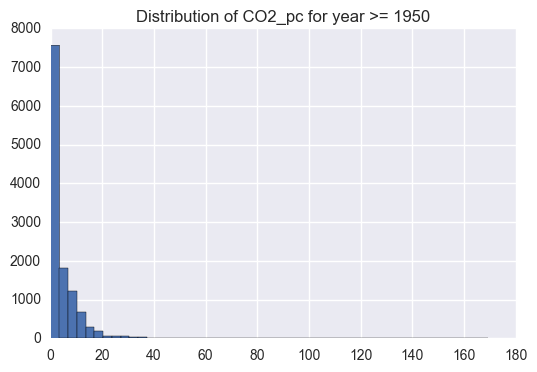

In [215]:
# CO2 dist since 1950
q = "year >= 1950"

co2_df.query(q)[val].hist(bins=50)
plt.title('Distribution of %s for %s' % (val, q)); 

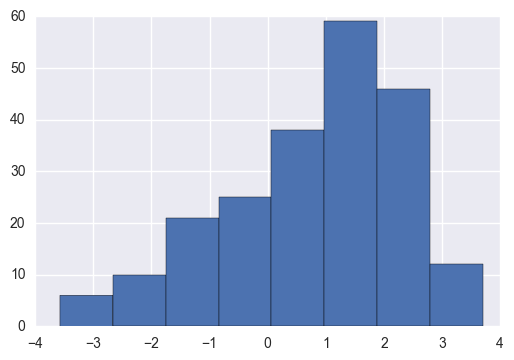

In [615]:
# log transform this long-tailed data
co2_df.query(q)[val].apply(np.log)\
    .replace([np.inf, -np.inf], np.nan).hist(bins=8);

## Distribution by region

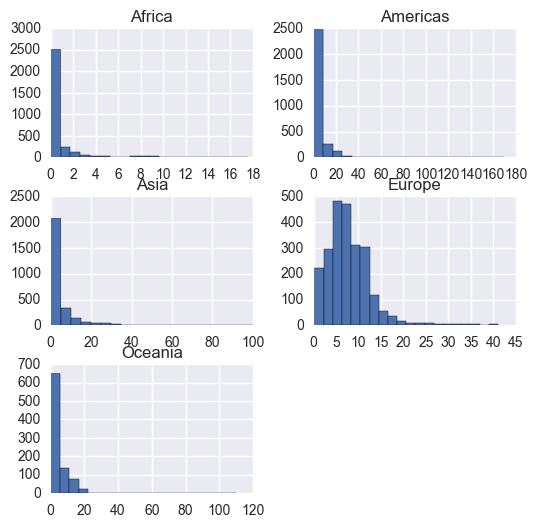

In [669]:
# dist by region
q = "year >= 1950"
co2_df.query(q).sort_values('region').set_index(['region', 'sub-region','country','year'])\
    .unstack(level=(0))[val]\
    .hist(bins=20, figsize=(6,6));

Interestingly, only Europe has a quasi-normal distribution. Everywhere else has extremely negatively-skewed distributions.

The longest tail appears to be in the Americas, to judge by the x-axis range.

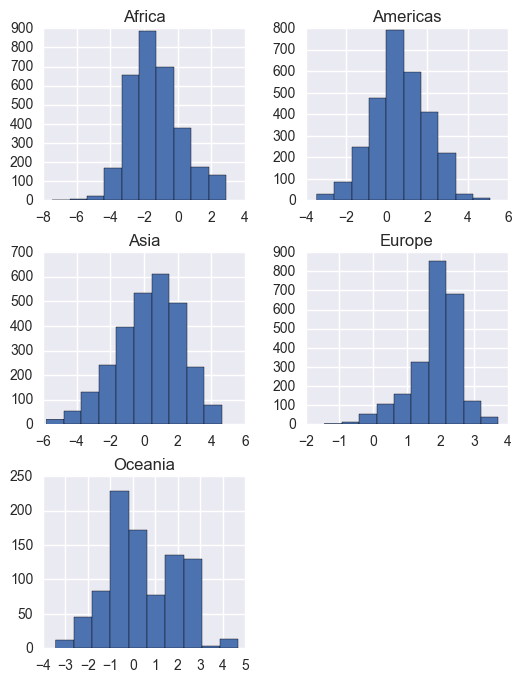

In [191]:
# apply natural log transform on CO2_pc
log_co2 = co2_df.query(q).sort_values('region').set_index(['region', 'sub-region','country','year'])\
    .unstack(level=0)[val].apply(np.log)
    
# replace numpy infinite values with nans
log_co2.replace([np.inf, -np.inf], np.nan)\
    .hist(bins=10, figsize=(6,8));


The distribution of the log `CO2_pc` values becomes normal except for: 
* Europe, which has a slight positive skew.
* Oceania, which appears to be bi-modal.

### Observations

*Europe has the only normal-ish distribution* 

* All regions have very negative-skew data, except for Europe which is closer to a normal distribution (albeit one with a long tail). 
* Asia & Americas have the longest tails.

*What about outliers?*

I can barely make out the long tails in these histograms. Boxplots will highlight where there are outliers.

## Outliers by region

In [ ]:
## helper function

# set style for showing outliers
flierprops = dict(marker='o', markersize=5, alpha=0.2)

def make_regional_boxplot(df, facet, showfliers):
    '''facets dataframe and shows boxplot for
    each facet, with title'''
    df.boxplot(by=facet, showfliers = showfliers, flierprops = flierprops, rot=45)
    plt.title(df['region'].unique())
    plt.show();

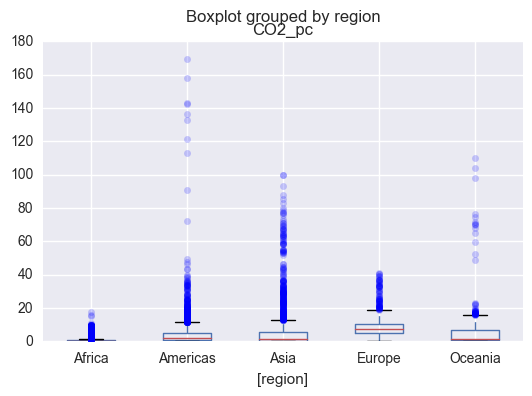

In [752]:
# reshape df so region, sub_region & CO2 are columns
co2_df_box = co2_df.query(q).sort_values(['region', 'sub-region']).\
set_index(['region', 'sub-region','country','year'])[val].reset_index(level=(0,1))
                                                                        
co2_df_box.boxplot(by='region', flierprops = flierprops);

#### Observations

* Asia has lots of outliers
* Americas has the most extreme outliers

So which sub-regions are represented by these outliers? Are the outliers spread equally among sub-regions?

### Where are the outliers?

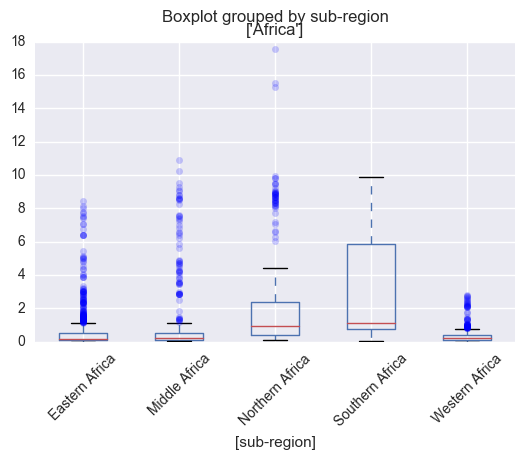

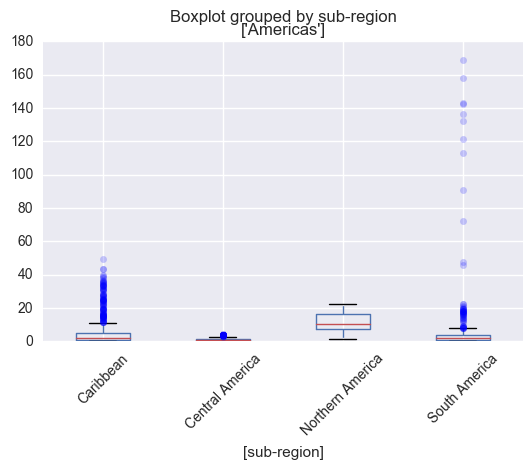

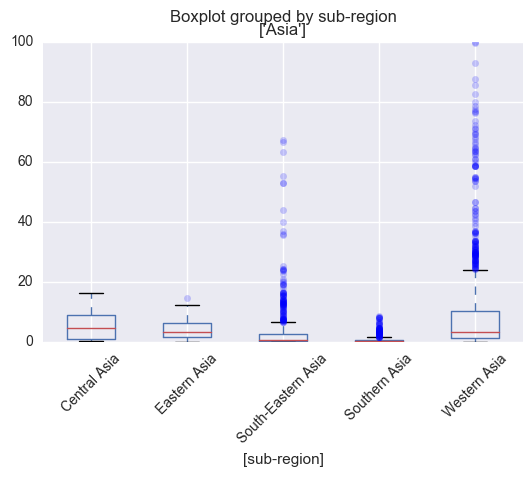

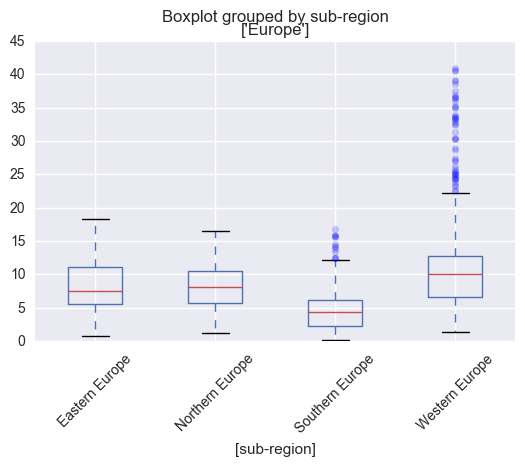

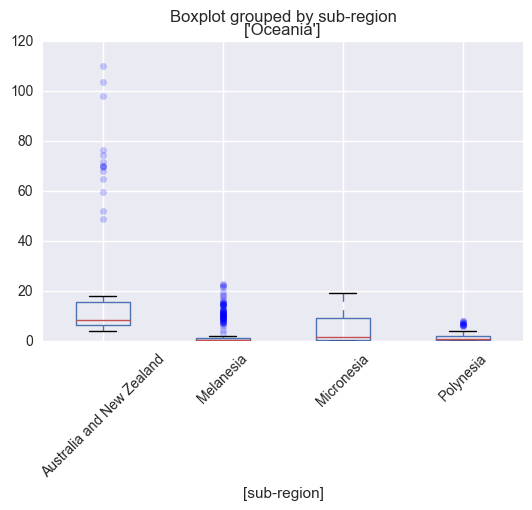

0    None
1    None
2    None
3    None
4    None
Name: df, dtype: object

In [753]:
# make boxplot subplots

# split reshaped into smaller regional co2_df's
regions_co2_dfs = facetize_df(co2_df_box, 'region')
showfliers=True
regions_co2_dfs['df'].apply(make_regional_boxplot, args=['sub-region', showfliers])

### Compare IQRs

Including outliers increases the y-axis scale, making it hard to see the differences in IQRs/boxes.
Hiding outliers will braing focus on the shape of the boxes themselves.

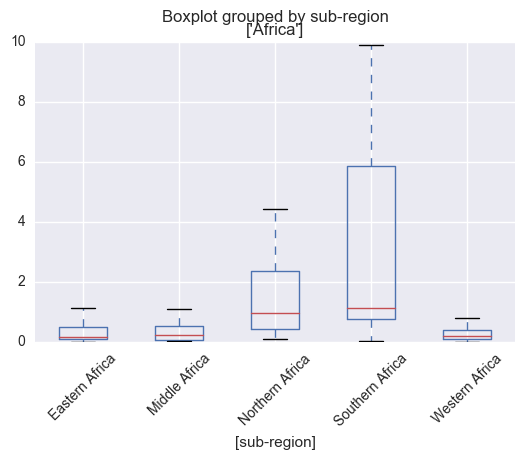

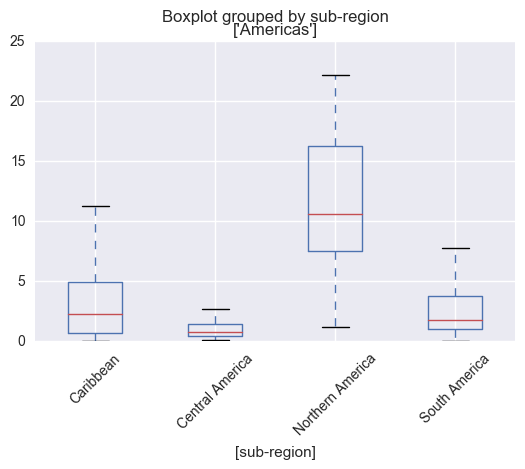

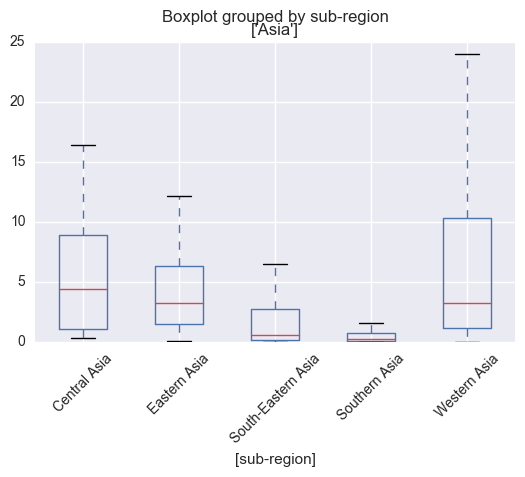

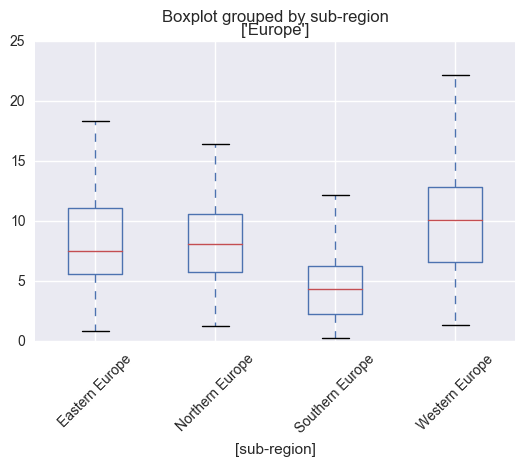

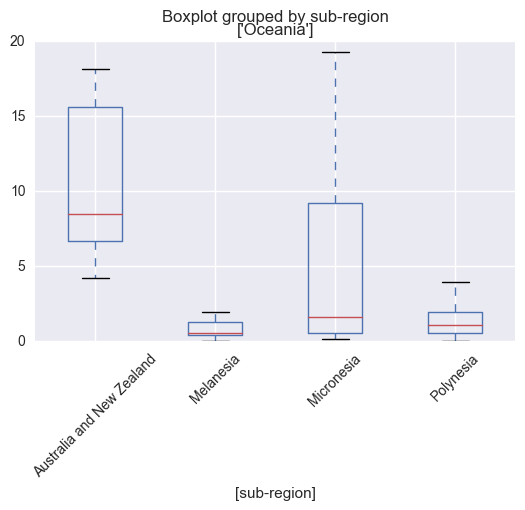

0    None
1    None
2    None
3    None
4    None
Name: df, dtype: object

In [755]:
# hide outliers from boxplots

showfliers=False
regions_co2_dfs['df'].apply(make_regional_boxplot, args=['sub-region', showfliers])

#### Observations
While it's hard to tell which region has the _most_ variation between sub-regions, Europe seems to have the least.

We can quantify this with some stats.

In [754]:
## quantify regional variations

# helper function
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]


q = "year >= 1950"
region_stats = co2_df.query(q).groupby('region').describe()[val]
region_stats.style.apply(highlight_max)

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Africa,3134,0.876144,1.829,0,0.08895,0.226705,0.654475,17.5523
Americas,2901,4.72814,9.57233,0.03153,0.8081,1.96057,5.00944,169.127
Asia,2801,5.55792,11.1381,0,0.35772,1.60469,5.368,99.8314
Europe,2368,7.95614,5.26457,0.23512,4.73499,7.17076,10.4254,41.0319
Oceania,903,4.92194,10.2444,0.0322,0.503925,1.23001,6.61092,109.941


In [758]:
# which region is most homogenous, i.e.
# has lowest coefficient of variance?

(region_stats['std']/region_stats['mean']).sort_values()

region
Europe      0.661699
Asia        2.004004
Americas    2.024546
Oceania     2.081364
Africa      2.087555
dtype: float64

### Extreme outliers

In [744]:
# which countries are the extreme outliers for each region?

# get outlier threshold for each region (q3 + 1.5 * IQR)
region_stats['outlier_th'] = region_stats.apply(
    lambda region: region['75%'] + 1.5 * (region['75%'] - region['25%']), axis=1)

yr = 1950
all_outliers = []
for region in co2_df['region'].unique():
    outlier_th = region_stats['outlier_th'].loc[region]
    q = "year >= @yr & region == @region"
    reg_df = co2_df.query(q)
    reg_df = reg_df.loc[reg_df[val] > outlier_th]\
        .groupby(['region','country']).size()\
        .sort_values()
    all_outliers.append(reg_df)

pd.concat(all_outliers)


region    country              
Asia      Mongolia                  1
          Kazakhstan                7
          Oman                      9
          Singapore                16
          Saudi Arabia             35
          Brunei                   36
          Bahrain                  43
          United Arab Emirates     45
          Kuwait                   54
          Qatar                    55
Europe    East Germany             11
          Luxembourg               59
Africa    Namibia                   1
          Mauritania                2
          Morocco                   9
          Zimbabwe                 10
          Equatorial Guinea        13
          Egypt                    20
          Mauritius                21
          St Helena                21
          Botswana                 24
          Seychelles               30
          Tunisia                  31
          Reunion                  35
          Algeria                  42
          Gabon   

#### Observations

I still get the impression that there is a disproportionate number of tiny countries among the outlier countries in the Americas (St Pierre et Miquelon, Falkland Islands) and Europe (Luxembourg, again), along with resource-intensive countries that you'd expect have a high `CO2_pc` (East Germany, USA, Canada).

## `CO2_pc` timeseries

Let's plot over the years to see how CO2 emissions have evolved.

### Mean CO2 since 1950

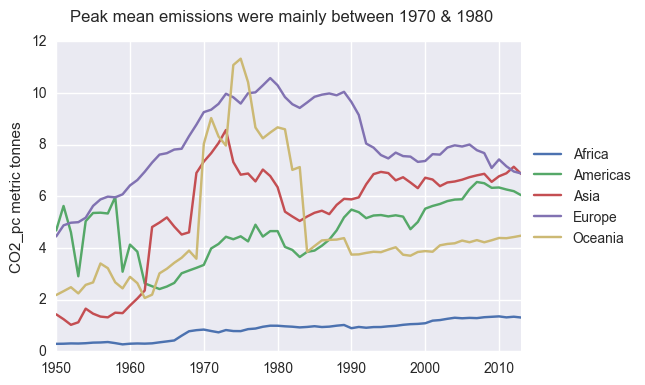

In [29]:
# mean CO2 by year & region
q = 'year >= 1950'
region_year = pd.DataFrame(co2_df.query(q).groupby(['year', 'region']).mean())[val]
region_year.unstack().plot();

plt.ylabel('%s metric tonnes' % val)
plt.xlabel('')
plt.suptitle("Peak mean emissions were between 1970 & 1980")
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

### Medians since 1950

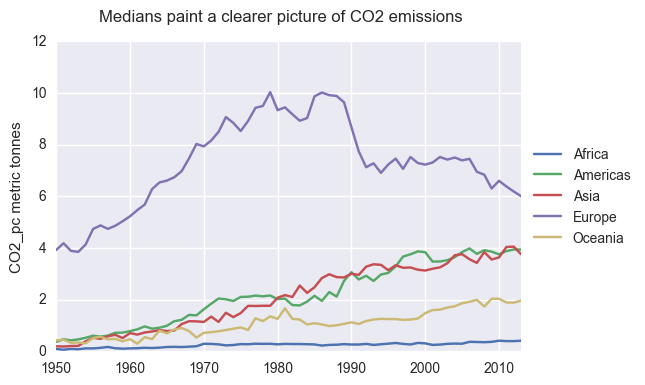

In [763]:
# median CO2 by year & region
region_year = pd.DataFrame(co2_df.query(q).groupby(['year', 'region']).median())[val]
region_year.unstack().plot()

plt.ylabel('%s metric tonnes' % val)
plt.xlabel('')
plt.suptitle("Medians paint a clearer picture of CO2 emissions", fontsize='medium', linespacing=10)
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

#### Observations

Europe remains the CO2 emissions gorilla. 

After steady growth between 1950 to 1980, European emissions wobbled in the 80s, then fell off a cliff around 1990. Emissions plateaued (now at late 60's levels) until around 2005, whereupon they steadily decreased.

By contrast, Asia, the Americas, and to a lesser extent Oceania have seen median CO2 emissions creep steadily upwards for the entire timeframe. You can almost imagine Asia & Amercia's curves converging with Europe's in a decade or so.

At the bottom of the medians plot, African emissions initially appear to be virtually flat, but they are increasing too. But Africa's baseline is so much lower in the first place that its CO2 growth is dwarfed by that of other regions.

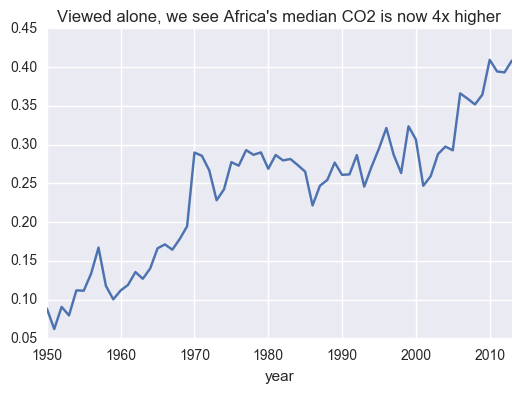

In [764]:
# show median Africa on its own
region_year.unstack()['Africa'].plot()
plt.title("Viewed alone, we see Africa's median CO2 is now 4x higher");


#### Stats

Here we'll quantify the change in median CO2 emssions for time period `q`.

In [776]:
# create df of start & end year medians
start = region_year.unstack().index.min()
end = region_year.unstack().index.max()
region_year.unstack().loc[[start, end]]

# show % change since starting median value
change = region_year.unstack().loc[[start, end], ].pct_change()
change.sort_values(2013, axis=1)\
    .multiply(100).round()\
    .dropna(how='all')


region,Europe,Africa,Oceania,Americas,Asia
year,,,,,
2013,53.0,361.0,369.0,980.0,1833.0


Wow. Usually plots are more eye-opening than numbers, but in this case it's the reverse.

# Zoom in on Europe

Why focus on Europe? 

* As home of the modern era's original superpowers, it has contributed the most to cumulative CO2 emissions. 
* For the 1950-2013 timefrme, Europe has the most homoegenous emission rates across sub-regions (measured by the coefficient of variation in mean `CO2_pc`)
* Unlike the other continents, median emissions have decreased dramatically since the mid-80s.
* Last but not least, it's been my home for the past 10 years (I'm Canadian but live in France).

## Plots

In [780]:
# create europe CO2 df
q = "region=='Europe' & year >= 1950"
co2_eur_df = co2_df.query(q).loc[co2_df['region']=='Europe'].copy().reset_index(drop=True)

# assign name attribute for use in plot titles
co2_eur_df.name = 'Europe CO2'


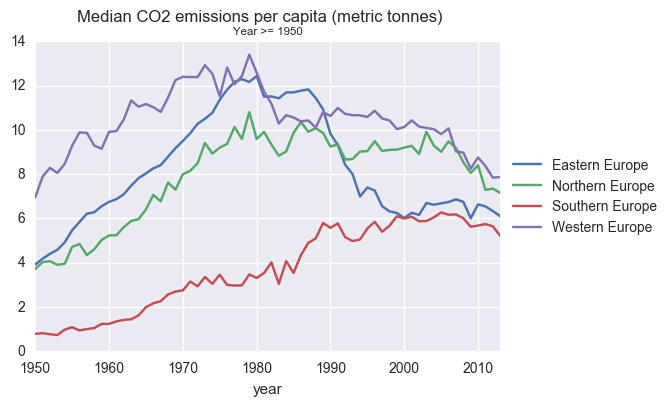

In [781]:
# create df of sub-region medians
q = "year >= 1950"
eur_medians = co2_eur_df.query(q).groupby(['year','region', 'sub-region'])[val].median().unstack()
eur_medians.reset_index('region').plot()

# plot
plt.suptitle('Median CO2 emissions per capita (metric tonnes)')
plt.title(str.title(q), fontsize='x-small')
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

#### Observations

Convergence! Median `CO2_pc` in Western Europe has fallen enough while Southern Europe's has increased so that the gap has been cut in half.

In [805]:
# gap in 1950
eur_medians.loc[start, 'Western Europe'].subtract(eur_medians.loc[start, 'Eastern Europe'])

region
Europe    3.03363
dtype: float64

In [806]:
# gap in 2013
eur_medians.loc[end, 'Western Europe'].subtract(eur_medians.loc[end, 'Eastern Europe'])

region
Europe    1.76512
dtype: float64

### Duplicate data?

One thing I noticed while cleaning the updated CO2 data is that, unlike for the original dataset, there seemed to be overlapping countries, such as:

* Germany, East Germany, and West Germany
* USSR and Russia
* The countries that were once part of Czechoslovakia & Yugoslavia

I'd like to drill-down on each sub-region to see whether there is duplicate data. For this, I'll need interactive plots. Plot.ly is excellent for this sort of thing.

In [807]:
# create spaghetti plots for each sub-region
plot_facet_timeseries(co2_eur_df, 'sub-region', 'CO2_pc')

#### Observations

There is plenty of duplicate data. See for yourself.

 * To view only one country, **double-click** the country in the legend. Then **single-click** the others to add them.
 * To reset, **double-click any other value**.

Western Europe: 
* Filter the plot so you only see E. Germany, W. Germany, and Germany.
   
* We have duplicate data

Eastern Europe:
* Do same as above for: 
    * Russia & Ussr - overlapping data
    * Czecheslovakia, Czech Rep. & Slovak Rep - overlap again. The line for Czech Rep. is actually _above_ that for Czecheslovakia, which doesn't make sense unless the latter is in reality an average of Slovak & Czech Republic.  
    
    
Southern Europe:
* Serbia; Serbia And Montenegro; Montenegro - overlap
* Yugoslavia is classified inconsistently as Eastern Europe, but does NOT overlap with the Serbias.

#### Clean & de-dupe

In [811]:
# change Yugoslavia so it's Southern Europe

# get index locations
yugo = co2_eur_df.loc[co2_eur_df['country']=='Yugoslavia']

# set new value
co2_eur_df['sub-region'].iloc[yugo.index]= 'Southern Europe'

# verify
co2_eur_df[co2_eur_df['country']=='Yugoslavia'].head()

,country,region,sub-region,year,CO2_pc
2326,Yugoslavia,Europe,Southern Europe,1950,1.08734
2327,Yugoslavia,Europe,Southern Europe,1951,1.01549
2328,Yugoslavia,Europe,Southern Europe,1952,1.00816
2329,Yugoslavia,Europe,Southern Europe,1953,0.98762
2330,Yugoslavia,Europe,Southern Europe,1954,1.16343


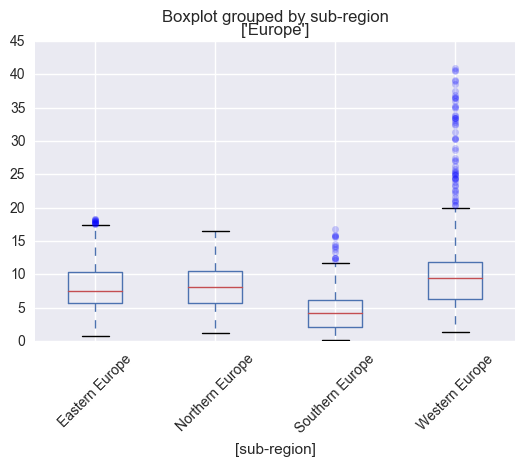

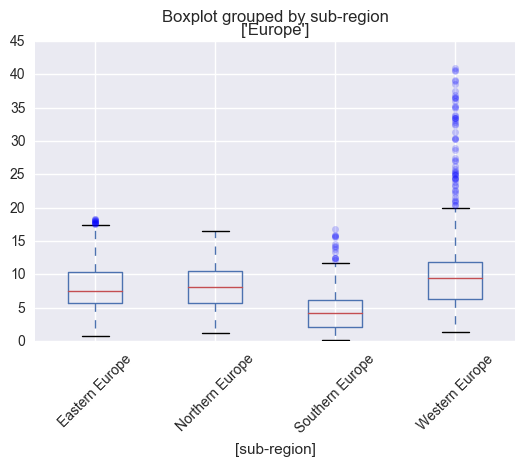

In [822]:
# Does this change the distributions?

drop_dupes = ['East Germany', 'West Germany', 'Ussr', 'Czechoslovakia', 'Serbia And Montenegro']
drop_index = co2_eur_df.loc[co2_eur_df['country'].isin(drop_dupes)].index

# show outliers in boxplots
showfliers = True

# with original df
make_regional_boxplot(co2_eur_df.set_index(['country', 'year']), 'sub-region', showfliers);

# with de-duped df
make_regional_boxplot(co2_eur_df.drop(drop_index)\
                      .set_index(['country', 'year']), 'sub-region', showfliers);


In [816]:
# hard to tell by the plots!

# before, with overlapping countries
co2_eur_orig = co2_eur_df.query(q).groupby('sub-region').describe()['CO2_pc']

# after dropping overlapping countries
co2_eur_dedupe = co2_eur_df.drop(drop_index).query(q).groupby('sub-region').describe()['CO2_pc']

# what's the difference?
co2_eur_dedupe - co2_eur_orig

,count,mean,std,min,25%,50%,75%,max
sub-region,,,,,,,,
Eastern Europe,-84.0,-0.433609,-0.123709,0.0,-0.18306,-0.35272,-0.915957,0.0
Northern Europe,0.0,0.000000,0.000000,0.0,0.00000,0.00000,0.000000,0.0
Southern Europe,-14.0,0.002366,0.028553,0.0,-0.03873,-0.02286,0.028130,0.0
Western Europe,-82.0,-0.411092,0.414775,0.0,-0.31471,-0.67570,-0.938580,0.0


In [817]:
# let's fix this for good
co2_eur_df = co2_eur_df.drop((drop_index))

### Observations

**Emissions exploded across the board during Baby Boomer decades**

From 1950 to the late 70s, all European sub-regions show steadily growing CO2 pc emissions. Southern Europe's CO2 emissions grew more slowly, however.

**Paths diverged during the 80s**

During the early 80s the curves begin to diverge not just between the sub-regions, but also within. The collapse of the Soviet Union in the late 80s-early 90s is seen in the sharp drop of the red CO2 curve for all sub-regions. Not surprisingly, this suggests a strong relationship between CO2 per capita emissions and economic activity.

This relationship is reinforced in the plot for "middle" (East & West) Europe. While the median for ex-USSR countries has a smooth upward trajectory all the way to the late 70s, the curve for non-Soviet nations indicates more volatile emissions for the decade starting ~1969. This era coincides with the OPEC oil crisis and consequent hyperinflation, market forces that I presume would not impact the centralized economy of the Soviet Union.

By contrast, S Europe median CO2 emissions kept on increasing, more slowly than in North and 'Middle' (East & West) Europe. Similarly, the curves divergence lagged the other sub-regions by a few years, not starting until the mid-80s. 

**Convergence in the last few years**

By the  the late 2000's, all sub-regions show a) downward trend in median CO2 emissions, and that b) the decline is noticeably faster for 'other' countries than for ex-USSR states.

### What prompted the CO2 declines of recent years?

Two things come to mind: 
* after 3 years of negotiating targets, 2008 marked the start of Phase 1 implementation for the Kyoto Protocol (Phase 1 ended in 2012)
* in the 2nd half of 2008 the global financial crash (Great Recession) began.




## Where have CO2 emissions decreased the most?

So the burning question (pardon the pun) is which European countries are seeing the most rapid decreases in CO2 emissions?

In [864]:
# get year of max CO2 for each country
max_co2 = co2_eur_df.set_index('year').groupby(['country'])[val].idxmax()\
    .reset_index()\
    .rename(columns={'CO2_pc':'year'})

In [865]:
# get max CO2 values for each country
merge_df = co2_eur_df[['country','year','CO2_pc']]
max_co2 = max_co2.merge(merge_df, on=['country', 'year'], how='inner')

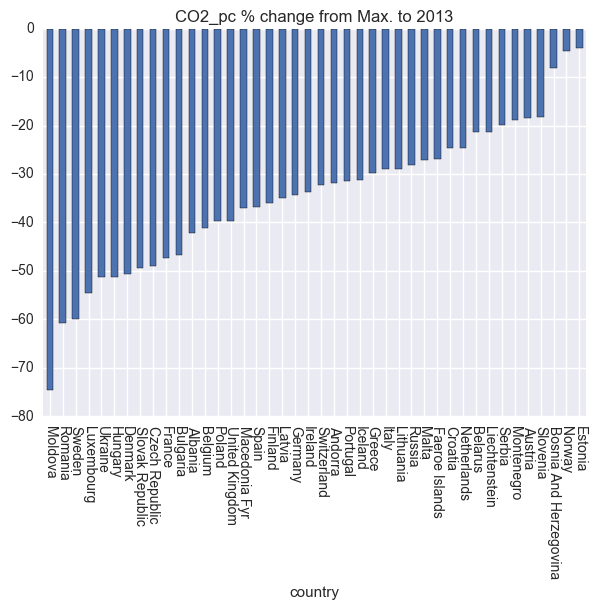

In [867]:
# get CO2 values for 2013
q = "year==2013"
co2_2013 = co2_eur_df.query(q)[['country','year','CO2_pc']]\
    .reset_index(drop=True)

#create df of max & 2013 values
changes = pd.concat([max_co2, co2_2013]).sort_values('country')\
    .groupby(['country', 'year']).mean()\
    .reset_index()\

# label which row is max value vs 2013 value for each country
changes['max_last'] = changes['year'].apply(lambda x: 'maxval' if x != 2013 else 'lastval')

# pivot df & calc change
changes_wide = changes.set_index(['country', 'max_last', 'year']).reset_index(['country','year'])\
    .drop('year', axis=1).pivot(columns='country', values='CO2_pc')\
    .reindex(index=['maxval', 'lastval'])\
    .pct_change()

# plot % change
changes_wide.drop('maxval')\
    .multiply(100)\
    .T.sort_values('lastval')\
    .dropna()\
    .plot(kind='bar', legend=None, rot=-90, figsize=(7,5))

plt.title(" ".join([val, '% change from Max. to 2013']));

In [777]:
## Helper functions

# calculate % change
def calc_percent_change(df, interval=1):
    """Reshapes & sorts df then calculates
    percentage change since previous interval of rows."""
    change_df = df.sort_values(['region', 'sub-region'])\
        .set_index(['region','sub-region','country','year'])\
        .unstack(level=(0,1,2))[val].pct_change(interval)
    
    return change_df

# create facet list
def make_facet_list(df, facet):
    facets = [facet for facet in df[facet].unique()]
    return facets

# reshape for heatmap
def reshape_for_heatmap(facet, df):
    facet_df = df.stack(level=(0,1)).reset_index(['region','sub-region'])
    facet_df = (facet_df.loc[facet_df['sub-region']==facet]
        .drop(['region','sub-region'], axis=1) #don't show in heatmap
        .dropna(axis=1, how='all') # removes cols for countries from other facets
        .sort_values(2013, axis=1, ascending=False))
    
    return facet_df

# format %change
def color_negative_red(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for negative
    strings, black otherwise.
    """
    color = 'red' if val < 0. else 'black'
    return 'color: %s' % color


In [868]:
q = "region=='Europe' & year >=1950"
df = co2_df.query(q)
df = (df.drop(['region','sub-region'], axis=1)
     .pivot('year', 'country', 'CO2_pc')
     .pct_change(4)
     .sort_values(2013, axis=1)
     .dropna(how='all'))

df.iplot(kind='heatmap', colorscale='Spectral', title="% Change WW")

In [ ]:
df.loc[2013].dropna(how='all').tail(10)

In [ ]:
co2_change.head().style.applymap(color_negative_red)

In [869]:
# create % change matrix
q = "region=='Europe' & year >=1990"
co2_change = calc_percent_change(co2_df.query(q), interval=5)


for sub in co2_df.query(q)['sub-region'].unique():
    sub_df = reshape_for_heatmap(sub, co2_change)
    sub_df.iplot(kind='heatmap', colorscale='Spectral', title=sub + ' (Non-normalized)')

In [706]:
# normalize rows between [1,-1] 

mins = abs(co2_change.min(axis=0)) # using abs to ensure result of division is neg
maxes = co2_change.max(axis=0)

neg = co2_change.mask(co2_change > 0).div(mins, axis=1)
pos = co2_change.mask(co2_change < 0).div(maxes, axis =1)
normalized_change = neg.fillna(pos)


# create heatmaps by sub-region
#facets = make_facet_list(co2_df.query(q), 'sub-region')
#pd.Series(facets).apply(reshape_for_heatmap, args=(normalized_change,))

for sub in co2_df.query(q)['sub-region'].unique():
    sub_df = reshape_for_heatmap(sub, normalized_change)
    sub_df.iplot(kind='heatmap', colorscale='Spectral', title=sub + ' (Normalized)')
             

In [707]:
eur_subs = [sub for sub in co2_df.query("region=='Europe'")['sub-region'].unique()]
eur_subs

['Southern Europe', 'Western Europe', 'Eastern Europe', 'Northern Europe']

In [708]:

for sub in eur_subs:
    
    new_df = co2_change.stack(
        level=(0,1)).reset_index(['region','sub-region'])
    sub_df = new_df.loc[new_df['sub-region']==sub].dropna(axis=1, how='all').iplot(kind='heatmap', colorscale='Spectral')
    
# plot
#co2_change.stack(['region', 'sub-region']).reset_index().set_index('year').iplot(kind='heatmap', colorscale='spectral')

### Kyoto targets: were they met?


In [872]:
# values from https://ec.europa.eu/clima/policies/strategies/progress/kyoto_1_en
kyoto = pd.read_csv('data/kyoto_targets.csv')
kyoto.head()

,country,target,eu-15,base_yr,end_yr
0,Austria,-0.130,True,1990,
1,Belgium,-0.075,True,1990,
2,Denmark,-0.210,True,1990,
3,Finland,0.000,True,1990,
4,France,0.000,True,1990,


In [874]:
# get co2 values to calculate whether countries
# met Kyoto targets

k_target = kyoto.rename(columns={'base_yr':'year', 'target':'target_chg'})

# get base yr CO2 values
targets = k_target.merge(co2_eur_df, on=['country','year'], how='left')


# get 2012 CO2 values
q = "year == 2012"
co2_2012 = co2_eur_df.query(q).drop('year', axis=1)

# merge with targets df
targets = targets.merge(co2_2012[['country','CO2_pc']], on ='country')\
    .rename(columns={'CO2_pc_x':'base_co2', 'CO2_pc_y': 'actual_co2'})

targets

,country,target_chg,eu-15,year,end_yr,region,sub-region,base_co2,actual_co2
0,Austria,-0.130,True,1990,,Europe,Western Europe,7.48457,7.36111
1,Belgium,-0.075,True,1990,,Europe,Western Europe,10.62712,8.32052
2,Denmark,-0.210,True,1990,,Europe,Northern Europe,9.77096,6.49935
3,Finland,0.000,True,1990,,Europe,Northern Europe,10.37566,8.99998
4,France,0.000,True,1990,,Europe,Western Europe,6.59601,5.23783
5,Germany,-0.210,True,1990,,Europe,Western Europe,12.83766,9.18553
6,Greece,0.250,True,1990,,Europe,Southern Europe,7.33063,7.19758
7,Ireland,0.130,True,1990,,Europe,Northern Europe,8.76763,7.65167
8,Italy,-0.065,True,1990,,Europe,Southern Europe,7.32380,6.18392
9,Luxembourg,-0.280,True,1990,,Europe,Western Europe,26.19960,20.02458


In [875]:
# calculate % change from base year to 2012
actual_change = pd.melt(targets, id_vars=['country'], value_vars=['base_co2', 'actual_co2'])\
    .sort_values('country')\
    .pivot(index='variable', columns='country', values='value')\
    .reindex(index=['base_co2', 'actual_co2'])\
    .pct_change()\
    .drop('base_co2').T
    
actual_change.rename(columns={'actual_co2': 'actual_chg'}, inplace=True)

# merge with 
targets = targets.merge(actual_change.reset_index())
targets['target_co2']= targets['base_co2'].multiply(1 + targets['target_chg'])

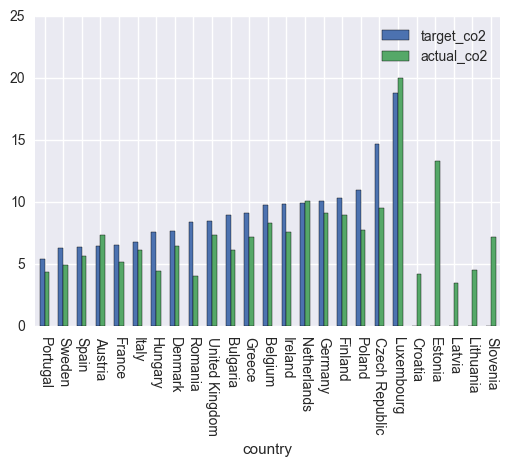

In [1085]:
targets.set_index('country')[['target_co2', 'actual_co2']]\
    .sort_values('target_co2')\
    .plot(kind='bar', rot=-90);

In [880]:
# how much did actual change % correlate with target change %?
targets.corr()['target_co2']

target_chg   -0.463425
eu-15        -0.186734
year          0.067480
base_co2      0.959411
actual_co2    0.890353
actual_chg   -0.278708
target_co2    1.000000
Name: target_co2, dtype: float64

In [877]:
# did they meet the 8% reduction for the original 15 EU countries?
targets.groupby('eu-15').sum()[['base_co2', 'actual_co2']].pct_change(axis=1)

,base_co2,actual_co2
eu-15,,
False,NaN,0.184808
True,NaN,-0.170500


In [879]:
subset = kyoto['eu-15']==True
eu15 = kyoto.loc[subset]['country']

q="country in @eu15"
targets.query(q).join(actual_change)[['target_chg', 'actual_chg']]\
    .sort_values('target_chg')\
    .plot(kind='bar')
    
plt.suptitle(" ".join(['Kyoto Target vs Actual', val, '%change, 2008-2012']))    
plt.title(q, fontsize='x-small');

ValueError: columns overlap but no suffix specified: Index([u'actual_chg'], dtype='object')

In [1026]:
# mean overall change for eu15
target_change.query(q).join(actual_change)[['target_chg', 'actual_chg']]\
    .mean()

target_chg   -0.021000
actual_chg   -0.144472
dtype: float64

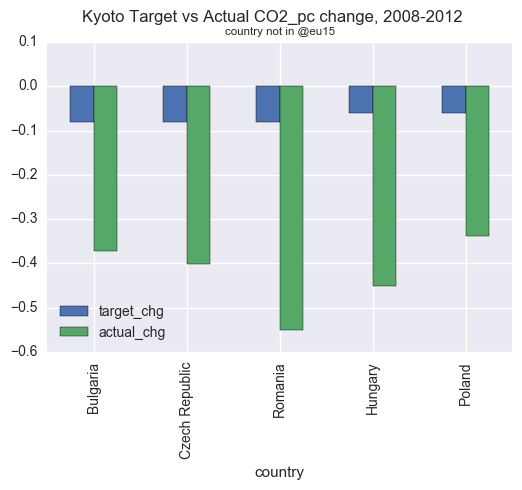

In [979]:
q="country not in @eu15"
target_change.query(q).join(actual_change)[['target_chg', 'actual_chg']]\
    .sort_values('target_chg')\
    .plot(kind='bar')
    
plt.suptitle(" ".join(['Kyoto Target vs Actual', val, 'change, 2008-2012']))    
plt.title(q, fontsize='x-small');

In [980]:
# mean overall change for non-eu15
target_change.query(q).join(actual_change)[['target_chg', 'actual_chg']]\
    .mean()

target_chg   -0.072000
actual_chg   -0.422571
dtype: float64

In [991]:
# what about non-eu countries?

# create list of non-eu countries
not_eu = ~co2_eur_df['country'].isin(kyoto['country'].unique())
co2_eur_df['country'].loc[not_eu].unique()


array(['Albania', 'Andorra', 'Belarus', 'Bosnia And Herzegovina',
       'Faeroe Islands', 'Gibraltar', 'Iceland', 'Liechtenstein',
       'Macedonia Fyr', 'Malta', 'Moldova', 'Montenegro', 'Norway',
       'Russia', 'Serbia', 'Slovak Republic', 'Switzerland', 'Ukraine',
       'Yugoslavia'], dtype=object)

### How much did meeting targets have to do with the accord, vs the economy?
Is there a stronger CO2 correlation with these targets, or with GDP? My hunch is the better off the country, the better able to comply with kyoto.


# Multi-variate analysis

In [219]:
# expand DF to include all columns
df = pd.read_csv(mypath + 'final_df.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 13 columns):
country                     17055 non-null object
region                      17055 non-null object
sub-region                  17055 non-null object
year                        17055 non-null int64
CO2_pc                      17055 non-null float64
energy_use_pc               5324 non-null float64
hdi                         3898 non-null float64
income_pc                   14969 non-null float64
motor_vehicles_per_1000     456 non-null float64
population                  12517 non-null float64
roads_paved_%               1977 non-null float64
sulfur_emissions_pc_kg      11230 non-null float64
surviving_kids_per_woman    13919 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.7+ MB


In [220]:
# fill missing values
#df = df.fillna(method='pad')
#df.info()

In [231]:
# drop duplicate countries as per Zoom-in on Europe section
drop_dupes
drop_index = df.loc[df['country'].isin(drop_dupes)].index
df = df.drop(drop_index)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16677 entries, 0 to 17054
Data columns (total 13 columns):
country                     16677 non-null object
region                      16677 non-null object
sub-region                  16677 non-null object
year                        16677 non-null int64
CO2_pc                      16677 non-null float64
energy_use_pc               5324 non-null float64
hdi                         3898 non-null float64
income_pc                   14969 non-null float64
motor_vehicles_per_1000     456 non-null float64
population                  12337 non-null float64
roads_paved_%               1977 non-null float64
sulfur_emissions_pc_kg      11230 non-null float64
surviving_kids_per_woman    13919 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


## Who has the biggest CO footprint?
China? The US? Let's see.

In [233]:
# convert population to int
# to enable bubble plots later on

df['population'] = df['population'].fillna(method='bfill').astype(int)
footprint =  df['CO2_pc'] * df['population']
df['CO2footprint'] = footprint

In [234]:
# store last year of data set
yr = df['year'].max()
q = "year==@yr"

#df.query(q).loc[df.query(q)['CO2footprint'].idxmax()]
df[['country','CO2_pc', 'population', 'CO2footprint']].loc[df.query(q)['CO2footprint'].idxmax()]

country               China
CO2_pc              7.52178
population       1362514260
CO2footprint    1.02485e+10
Name: 3156, dtype: object

In [243]:
# show in bubble plot
yr = 2013
q = "year==@yr"
val = 'CO2_pc'
size = 'CO2footprint'
x = 'population'
df.query(q).iplot(kind='bubble', x=x, y=val, size=size, text= 'country',\
           xTitle= x + " (log scale)", yTitle=val, categories='region', logx=True,\
             title='Who had the biggest %s in %s?' % (size, yr))

In [237]:
# what did this look like a few decades earlier?
yr = 1990
q = "year==@yr"
val = 'CO2_pc'
size = 'CO2footprint'
x = 'population'
df.query(q).iplot(kind='bubble', x=x, y=val, size=size, text='country',\
           xTitle= x, yTitle=val, categories='region', logx=True,\
             title='Who had the biggest %s in %s?' % (size, yr))

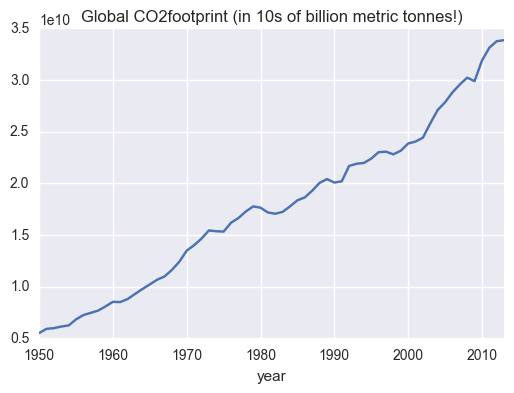

In [661]:
# What does the global trend line look like?
kind = 'Global'
val = 'CO2footprint'
unit = '(in 10s of billion metric tonnes!)'

annual_totals = df.groupby('year').sum()[val]
annual_totals.loc[1950:].plot()
plt.title(" ".join([kind, val, unit]));

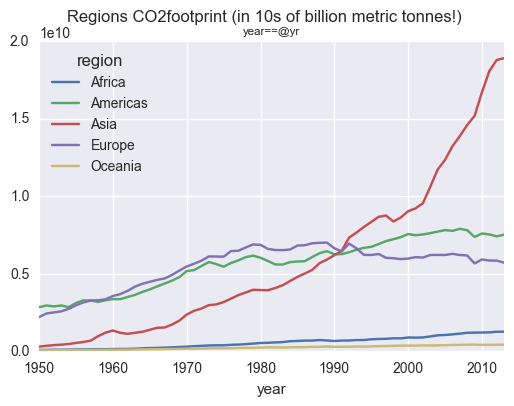

In [662]:
# regional timeseries
kind = 'Regions'
annual_totals = df.groupby(['region','year']).sum()[val]
annual_totals.unstack(level=0).loc[1950:].plot()
plt.suptitle(" ".join([kind, val, unit]))
plt.title(q, fontsize='x-small');

In [681]:
# change from 1990 to 2013 by country
q = "year == 1990 | year == 2013"
val = 'CO2footprint'
footprint_df = df.query(q).set_index(['year', 'country']).drop(['region', 'sub-region'], axis=1)[val]
footprint_df.unstack()

country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua And Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wallis Et Futuna,Yemen,Yugoslavia,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1990,2.614318e+06,5.309325e+06,7.793506e+07,NaN,5.115037e+06,NaN,300666.91798,1.126034e+08,NaN,1.730666e+06,...,3.993006e+06,NaN,65999.5133,1.221512e+08,2.140622e+07,NaN,9.595672e+06,1.337910e+08,2.445630e+06,1.550268e+07
2013,2.126665e+07,4.814330e+06,1.342036e+08,419453.4275,3.246099e+07,120066.375,524333.59650,1.898012e+08,5.496328e+06,8.763332e+05,...,7.604678e+06,1.032168e+08,106334.3633,1.855150e+08,1.526107e+08,22011.6125,2.534402e+07,NaN,3.824328e+06,1.377939e+07


In [664]:
# what is the total CO2 footprint for 2013?
# will be used later to calculate % of totals
q = "year == 2013"
ww_footprint = df.query(q)[val].sum()
ww_footprint

33853051310.522152

In [665]:
# which countries had the biggest absolute incr?
footprint_df.unstack().diff().loc[2013].dropna().sort_values(ascending=False).head()

country
China            7.788010e+09
India            1.415467e+09
Iran             4.059290e+08
United States    3.625781e+08
South Korea      3.455244e+08
Name: 2013, dtype: float64

In [666]:
# biggest % increase
footprint_df.unstack().pct_change().multiply(100).loc[2013].dropna().sort_values().tail()

country
Lao                   922.519895
Nepal                 924.759655
Somalia              3300.374045
Equatorial Guinea    4372.676676
Namibia              7207.839766
Name: 2013, dtype: float64

In [667]:
# biggest % decrease
footprint_df.unstack().pct_change().multiply(100).loc[2013].dropna().sort_values().head()

country
North Korea   -77.654545
Nauru         -65.760967
Romania       -55.472898
Aruba         -49.364407
Bulgaria      -47.780817
Name: 2013, dtype: float64

In [672]:
# Their 2013 footprint is what % of world total?

top5_pct_decr = footprint_df.unstack().pct_change().multiply(100)\
    .loc[2013]\
    .dropna().sort_values().head()\
    .index.values
    
q = "year == 2013 & country in @top5_pct_decr"
val = 'CO2footprint'

footprints = df.query(q)[['country', val]]

pct_total = footprints[['country', val]][val]\
    .divide(ww_footprint).multiply(100)\
    .rename('% of Total')
    
pd.concat([footprints, pct_total], axis=1)

,country,CO2footprint,% of Total
583,Aruba,8.763332e+05,0.002589
2232,Bulgaria,3.955970e+07,0.116857
10124,Nauru,4.268467e+04,0.000126
10922,North Korea,5.008667e+07,0.147953
12375,Romania,7.073009e+07,0.208933


In [673]:
# which countries had biggest absolute decr?
footprint_df.unstack().diff().loc[2013].dropna().sort_values().head()

country
Russia           -5.401862e+08
Germany          -2.563956e+08
North Korea      -1.740604e+08
United Kingdom   -9.844260e+07
Romania          -8.811719e+07
Name: 2013, dtype: float64

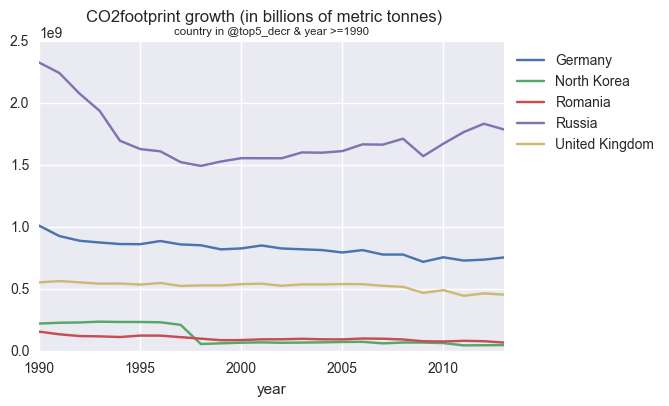

In [674]:
top5_decr = footprint_df.unstack().diff().loc[2013].dropna()\
    .sort_values()\
    .head().index
    
q = "country in @top5_decr & year >=1990"
unit = "(in billions of metric tonnes)"
main_title = " ".join([val, "growth", unit])

df.query(q).set_index(['year', 'country'])[val]\
    .unstack()\
    .plot()
    
plt.suptitle(main_title)
plt.title(q, fontsize='x-small')
plt.legend(loc='best', bbox_to_anchor=(1.35, 1));

In [675]:
# How many countries saw in incr in CO2 emissions between 1990 & 2013?
footprint_chg = footprint_df.unstack().pct_change().multiply(100).loc[2013]
footprint_chg.where(footprint_chg > 0).count()

155

In [678]:
# what was their total footprint increase?
footprint_chg.where(bigfoot_s > 0).sum()

41205.295771620295

In [676]:
# how many saw a decrease?
footprint_chg.where(bigfoot_s <= 0).count()

29

In [677]:
# what was their total footprint decrease?
footprint_chg.where(bigfoot_s <= 0).sum()

-728.732588343621

In [683]:
# compare correlations for the two groups
countries_incr = footprint_chg.where(footprint_chg > 0).dropna().index.values
countries_decr = footprint_chg.where(footprint_chg <= 0).dropna().index.values

In [922]:
# and the totals for top *absolute* incr & decr?
top10_incr = footprint_df.unstack().diff().loc[2013].dropna().sort_values().tail(10).index.values
top10_decr = footprint_df.unstack().diff().loc[2013].dropna().sort_values().head(10).index.values
#top10_incr = footprint_chg.where(footprint_chg > 0).dropna().sort_values().tail(10).index.values
#top10_decr = footprint_chg.where(footprint_chg <= 0).dropna().sort_values().head(10).index.values

In [930]:
# increasing footprint correlations
q = "year >= 1990 & country in @countries_incr"
val = 'CO2_pc'

df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                      1.000000
energy_use_pc               0.830441
income_pc                   0.804417
hdi                         0.525765
motor_vehicles_per_1000     0.444138
roads_paved_%               0.365189
CO2footprint                0.153196
year                        0.048113
sulfur_emissions_pc_kg      0.038906
population                 -0.026946
surviving_kids_per_woman   -0.296748
Name: CO2_pc, dtype: float64

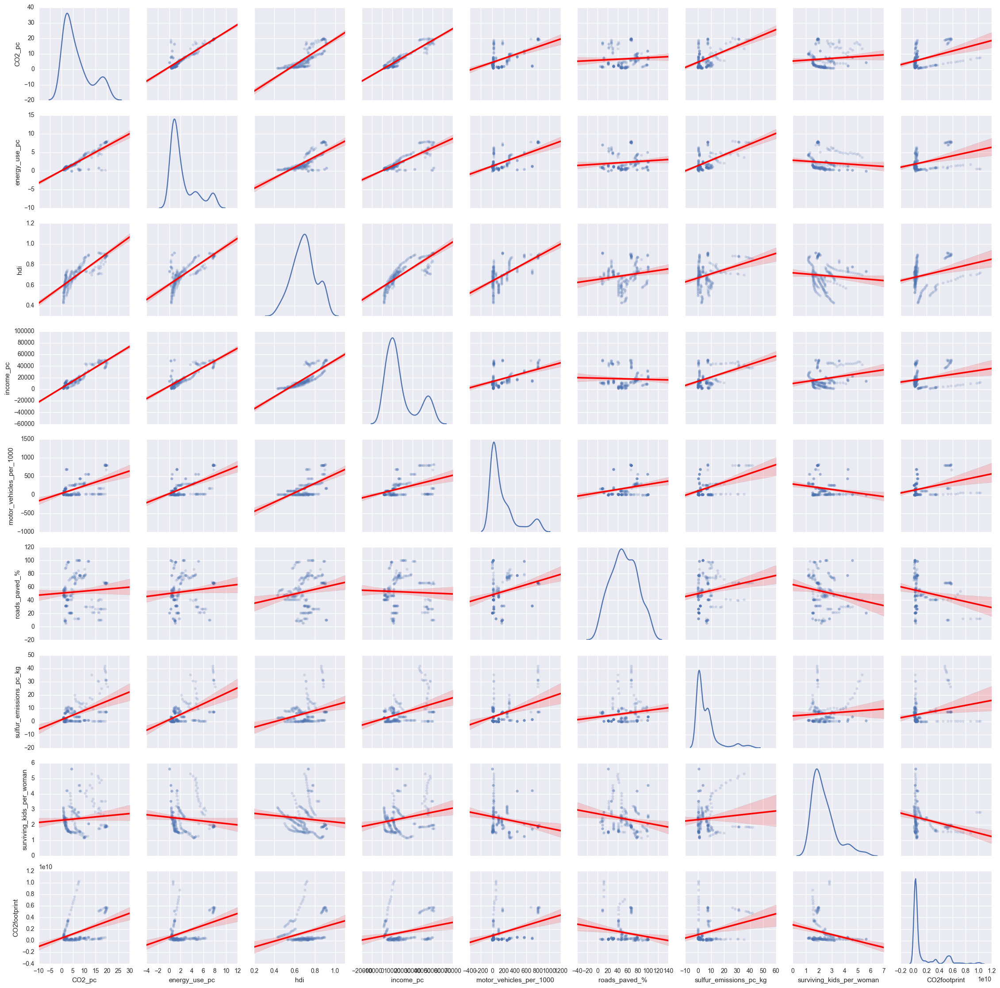

In [925]:
q = "year >=1990 & country in @top10_incr"
plot_kws={'line_kws':{'color':'red'}, 'scatter_kws': {'alpha': 0.2}}
sns.pairplot(df.query(q).drop(['year', 'population'], axis=1), 
             kind='reg', diag_kind='kde', plot_kws = plot_kws);

In [943]:
# any different for the shrinking footprint group?
q = "year >= 1990 & country in @countries_decr"
val = 'CO2_pc'

df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                      1.000000
hdi                         0.380994
motor_vehicles_per_1000     0.377479
energy_use_pc               0.213409
CO2footprint                0.208449
roads_paved_%               0.129365
income_pc                   0.101425
sulfur_emissions_pc_kg      0.075675
population                  0.021292
surviving_kids_per_woman   -0.042145
year                       -0.150723
Name: CO2_pc, dtype: float64

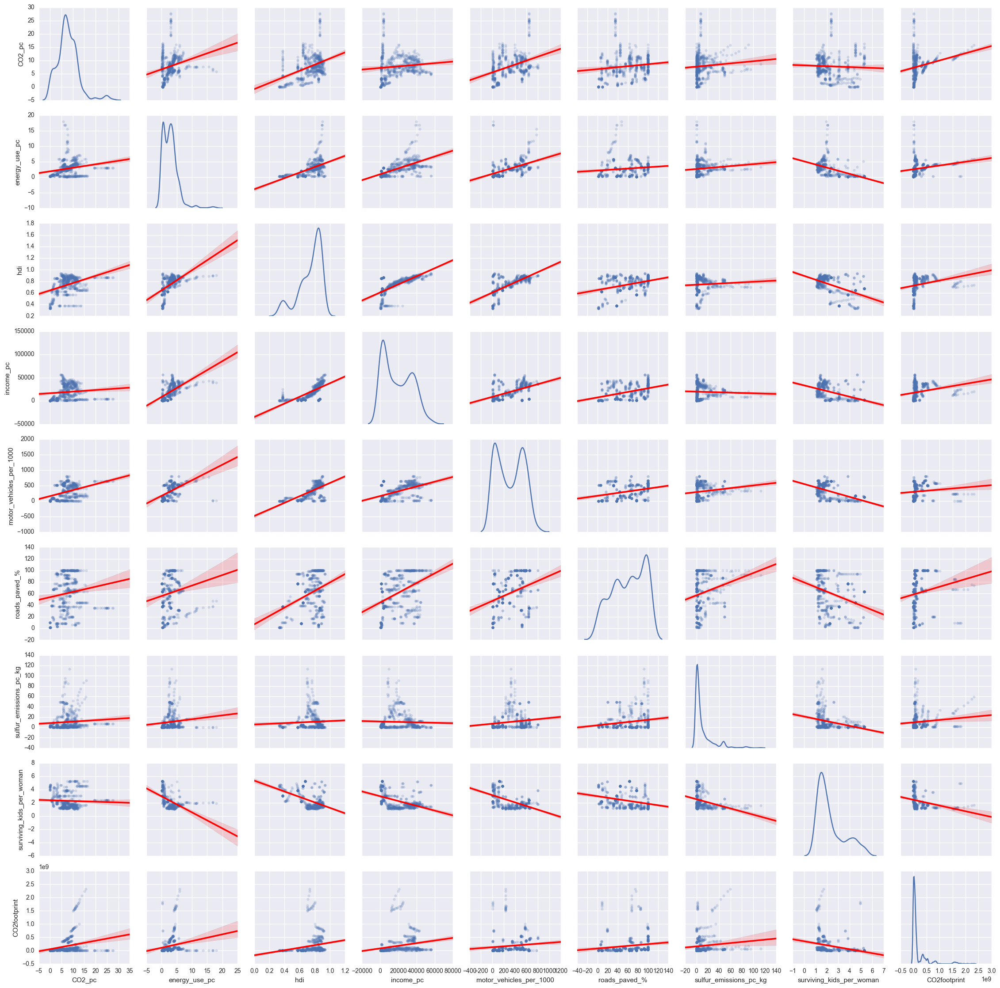

In [944]:
q = "year >=1990 & country in @countries_decr"
plot_kws={'line_kws':{'color':'red'}, 'scatter_kws': {'alpha': 0.2}}
sns.pairplot(df.query(q).drop(['year', 'population'], axis=1), 
             kind='reg', diag_kind='kde', plot_kws = plot_kws);

In [939]:
# regional differences?
df.query(q).groupby('region').corr()[val].sort_values(ascending=False).unstack(level=0)

region,Africa,Americas,Asia,Europe,Oceania
CO2_pc,1.000000,1.000000,1.000000,1.000000,1.000000e+00
CO2footprint,0.991689,0.767546,0.984941,0.342098,9.972063e-01
energy_use_pc,0.961117,0.550168,0.227695,0.145715,-9.878382e-16
hdi,0.863838,0.885722,0.409401,-0.004739,9.403460e-16
income_pc,0.963912,0.902414,-0.367597,0.012719,7.899960e-01
motor_vehicles_per_1000,0.938685,0.913861,0.417612,0.137894,NaN
population,-0.873112,-0.291066,0.115834,0.242003,-7.342277e-01
roads_paved_%,0.754093,0.019463,-0.572503,0.148785,NaN
sulfur_emissions_pc_kg,0.878914,0.619837,0.186680,0.074608,-9.403460e-16
surviving_kids_per_woman,-0.597592,-0.159406,-0.353755,0.171444,-9.403460e-16


In [694]:
df.query(q).groupby('region')['country'].unique().apply(lambda x: len(x))

region
Africa      51
Americas    42
Asia        39
Europe       9
Oceania     14
Name: country, dtype: int64

In [938]:
s = df.query(q).groupby('region')['country'].unique()
s.apply(", ".join)

region
Africa                                Congo Dem Rep, Zimbabwe
Americas    Aruba, Bermuda, French Guiana, St Pierre Et Mi...
Asia                                       North Korea, Syria
Europe      Albania, Belgium, Bulgaria, Czech Republic, De...
Oceania                                                 Nauru
Name: country, dtype: object

In [687]:
# regional differences?
df.query(q).groupby('region').corr()[val].sort_values(ascending=False).unstack(level=0)

region,Africa,Americas,Asia,Europe,Oceania
CO2_pc,0.991689,0.767546,0.984941,0.342098,0.997206
CO2footprint,1.000000,1.000000,1.000000,1.000000,1.000000
energy_use_pc,0.963642,NaN,0.532706,0.004374,NaN
hdi,0.881810,NaN,0.797052,-0.092647,NaN
income_pc,0.968140,NaN,-0.467606,-0.050835,0.747641
motor_vehicles_per_1000,1.000000,NaN,0.779306,0.117855,NaN
population,-0.884868,0.319993,0.281617,0.967964,-0.681800
roads_paved_%,0.470144,NaN,-0.677415,0.281555,NaN
sulfur_emissions_pc_kg,0.929062,NaN,-0.573321,0.116482,NaN
surviving_kids_per_woman,-0.638821,NaN,-0.467818,-0.266013,NaN


In [692]:
# how many countries in each of these regions?
df.query(q).groupby('region')['country'].unique().apply(lambda x: len(x))

region
Africa       2
Americas     4
Asia         2
Europe      20
Oceania      1
Name: country, dtype: int64

In [945]:
q = "year >= 1990 & country in @top10_incr"
val = 'CO2footprint'

df.query(q).corr()[val].sort_values(ascending=False)

CO2footprint                1.000000
population                  0.563304
CO2_pc                      0.399710
energy_use_pc               0.360847
motor_vehicles_per_1000     0.329340
hdi                         0.273081
income_pc                   0.238354
sulfur_emissions_pc_kg      0.236838
year                        0.167312
roads_paved_%              -0.186941
surviving_kids_per_woman   -0.245723
Name: CO2footprint, dtype: float64

In [741]:
q = "year >= 1990 & country in @countries_incr"
val = 'CO2footprint'

df.query(q).corr()

,year,CO2_pc,energy_use_pc,hdi,income_pc,motor_vehicles_per_1000,population,roads_paved_%,sulfur_emissions_pc_kg,surviving_kids_per_woman,CO2footprint
year,1.000000,0.048113,0.054052,0.191643,0.087249,-0.101309,0.024849,0.133329,-0.040912,-0.255750,0.044396
CO2_pc,0.048113,1.000000,0.965497,0.564743,0.867612,0.671386,-0.026946,0.473232,0.062006,-0.357449,0.153196
energy_use_pc,0.054052,0.965497,1.000000,0.609760,0.897562,0.683255,-0.070948,0.504644,0.042158,-0.335030,0.160782
hdi,0.191643,0.564743,0.609760,1.000000,0.673592,0.773987,-0.006852,0.638584,0.070072,-0.746825,0.180904
income_pc,0.087249,0.867612,0.897562,0.673592,1.000000,0.756551,-0.056541,0.532756,0.060270,-0.430931,0.116995
motor_vehicles_per_1000,-0.101309,0.671386,0.683255,0.773987,0.756551,1.000000,-0.108838,0.493302,NaN,-0.547186,0.155531
population,0.024849,-0.026946,-0.070948,-0.006852,-0.056541,-0.108838,1.000000,0.016404,-0.013968,-0.150878,0.686719
roads_paved_%,0.133329,0.473232,0.504644,0.638584,0.532756,0.493302,0.016404,1.000000,0.053020,-0.521040,0.095112
sulfur_emissions_pc_kg,-0.040912,0.062006,0.042158,0.070072,0.060270,NaN,-0.013968,0.053020,1.000000,-0.055526,0.008773
surviving_kids_per_woman,-0.255750,-0.357449,-0.335030,-0.746825,-0.430931,-0.547186,-0.150878,-0.521040,-0.055526,1.000000,-0.221236


In [735]:
q = "year == 2013"
df.query(q).set_index('country')['CO2footprint'].sort_values(ascending=False).head(20)

country
China             1.024853e+10
United States     5.185696e+09
India             2.034570e+09
Russia            1.788912e+09
Japan             1.243272e+09
Germany           7.572434e+08
Iran              6.169202e+08
South Korea       5.924451e+08
Saudi Arabia      5.413798e+08
Brazil            5.036321e+08
Mexico            4.885581e+08
Indonesia         4.793219e+08
Canada            4.756915e+08
South Africa      4.711959e+08
United Kingdom    4.574313e+08
Australia         3.778721e+08
Italy             3.447364e+08
France            3.331605e+08
Turkey            3.234222e+08
Thailand          3.030903e+08
Name: CO2footprint, dtype: float64

In [529]:
top5_ttl_incr + top5_ttl_decr

9160306650.755072

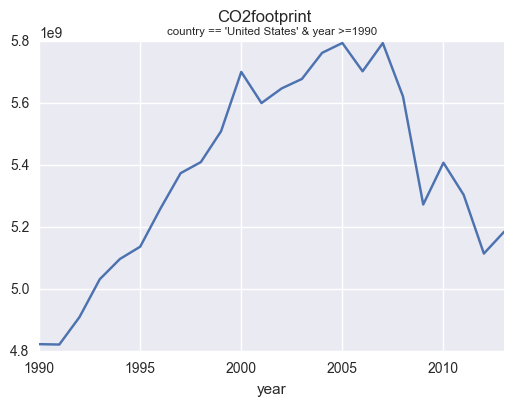

In [499]:
# Looking at the graph, it's still hard to 
# grasp how the US still has such big
# footprint incr, as the curve appears flat. 
# But when viewed on its own, the incr is clear

q = "country == 'United States' & year >=1990"

df.query(q).set_index(['year', 'country'])[val]\
    .unstack()\
    .plot(legend=False)
    
plt.suptitle(val)
plt.title(q, fontsize='x-small');

In [524]:
# what % is the 2013 footprint for top5_incr
# compared to world total?

q = "year == 2013 & country in @top5_incr"

footprints = df.query(q)[['country', val]]

pct_total = footprints[['country', val]][val]\
    .divide(ww_footprint).multiply(100)\
    .rename('% of Total')
    
pd.concat([footprints, pct_total], axis=1).sort_values('% of Total')

,country,CO2footprint,% of Total
13556,South Korea,5.924451e+08,1.750049
7531,Iran,6.169202e+08,1.822347
7295,India,2.034570e+09,6.010003
16175,United States,5.185696e+09,15.318252
3156,China,1.024853e+10,30.273586


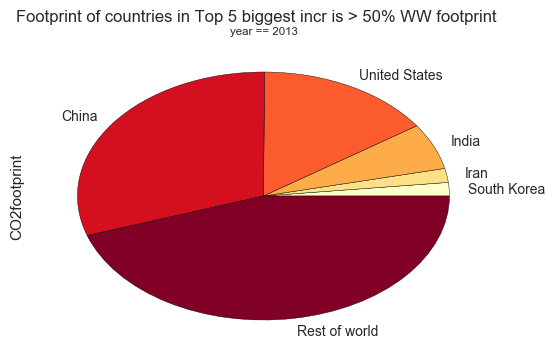

In [501]:
# can we visualize this?

q = "year == 2013"
bigfoot_bool = df.query(q)['country']\
    .apply(lambda x: x if x in top5_incr else 'Rest of world')\
    .rename('label')
    
footprint_by_label = pd.concat([df.query(q)[['country', 'CO2footprint']], bigfoot_bool], axis=1)\
    .groupby('label').sum()
    
footprint_by_label[val].sort_values().plot(kind='pie', colormap='YlOrRd')
plt.suptitle("Footprint of countries in Top 5 biggest incr is > 50% WW footprint")
plt.title(q, fontsize='x-small');


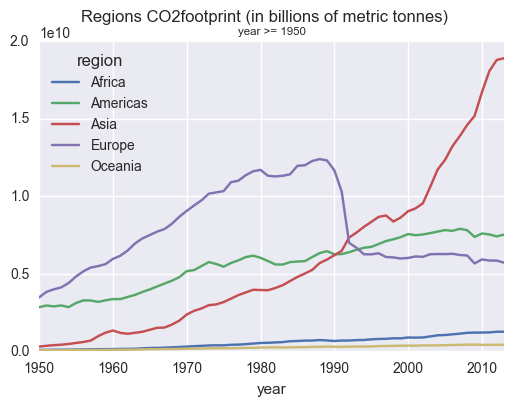

In [511]:
q = "year >= 1950"
kind = 'Regions'
val = 'CO2footprint'

annual_totals = df.query(q).groupby(['region','year']).sum()[val]
annual_totals.unstack(level=0).loc[1950:].plot()

plt.suptitle(" ".join([kind, val, unit]))
plt.title(q, fontsize='x-small');

In [31]:
# 2013 total CO2 footprint for Europe
q = "year==@end_yr & region=='Europe'"
total_2013 = df.query(q)['CO2footprint'].sum()
total_2013

q = "year==1990 & region=='Europe'"
total_1990 = df.query(q)['CO2footprint'].sum()
total_1990

(total_2013-total_1990)/total_1990

-0.5103022119631385

In [32]:
# how does this compare to other regions?
q = "year==@end_yr"
total_2013 = df.query(q).groupby('region')['CO2footprint'].sum()
total_2013

q = "year==1990"
total_1990 = df.query(q).groupby('region')['CO2footprint'].sum()
total_1990

(total_2013-total_1990)/total_1990

region
Africa      0.900963
Americas    0.202081
Asia        2.050853
Europe     -0.510302
Oceania     0.453460
Name: CO2_footprint, dtype: float64

## Correlations

In [245]:
# global correlations

q="year >=1950"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                      1.000000
energy_use_pc               0.838864
income_pc                   0.770431
motor_vehicles_per_1000     0.618909
hdi                         0.562471
roads_paved_%               0.440285
sulfur_emissions_pc_kg      0.209800
CO2footprint                0.150203
year                        0.082743
population                 -0.017419
surviving_kids_per_woman   -0.248434
Name: CO2_pc, dtype: float64

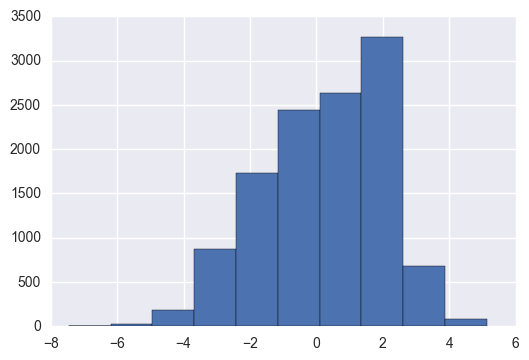

In [261]:
val = 'CO2_pc'
test = df.query(q)[val]
#test.hist(log=True);
log_CO2 = test.apply(np.log).replace(['np.inf', -np.inf], np.nan).rename('log_co2')

log_CO2.hist();

In [262]:
pd.concat([df.query(q), log_CO2], axis=1).head()

,country,region,sub-region,year,CO2_pc,energy_use_pc,hdi,income_pc,motor_vehicles_per_1000,population,roads_paved_%,sulfur_emissions_pc_kg,surviving_kids_per_woman,CO2footprint,log_co2
1,Afghanistan,Asia,Southern Asia,1950,0.01088,NaN,NaN,1040.0,NaN,7752118,NaN,0.0758,2.89,84343.04384,-4.520829
2,Afghanistan,Asia,Southern Asia,1951,0.01169,NaN,NaN,1060.0,NaN,7839426,NaN,0.0932,2.89,91642.88994,-4.449022
3,Afghanistan,Asia,Southern Asia,1952,0.01155,NaN,NaN,1070.0,NaN,7934798,NaN,0.1100,3.02,91646.91690,-4.461070
4,Afghanistan,Asia,Southern Asia,1953,0.01323,NaN,NaN,1120.0,NaN,8038312,NaN,0.1260,3.02,106346.86776,-4.325268
5,Afghanistan,Asia,Southern Asia,1954,0.01305,NaN,NaN,1130.0,NaN,8150037,NaN,0.1420,3.02,106357.98285,-4.338967


In [289]:
val='log_co2'
corr = pd.concat([df.query(q), log_CO2], axis=1).groupby('region').corr()
corr[val].unstack()

,CO2_pc,CO2footprint,energy_use_pc,hdi,income_pc,log_co2,motor_vehicles_per_1000,population,roads_paved_%,sulfur_emissions_pc_kg,surviving_kids_per_woman,year
region,,,,,,,,,,,,
Africa,0.735228,0.418488,0.739830,0.857341,0.657692,1.0,0.880468,0.067582,0.571836,0.326688,-0.085321,0.265516
Americas,0.622515,0.269703,0.792839,0.828118,0.777860,1.0,0.831693,0.209669,0.421847,0.530666,-0.601707,0.391036
Asia,0.641821,0.121543,0.706342,0.846306,0.644585,1.0,0.663138,-0.032319,0.461949,0.202101,-0.134370,0.356345
Europe,0.847264,0.299780,0.674248,0.481794,0.507965,1.0,0.606762,0.203314,0.266639,0.489708,-0.384610,0.251754
Oceania,0.664392,0.382231,0.947215,0.895145,0.815522,1.0,0.917891,0.358290,0.760944,0.755401,-0.784482,0.240294


In [655]:
# correlations for top5 biggest CO2 footprint increases

q = "year >= 1950 & country in @top5_incr"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                      1.000000
income_pc                   0.934917
motor_vehicles_per_1000     0.930650
energy_use_pc               0.930627
hdi                         0.455875
year                        0.355833
sulfur_emissions_pc_kg      0.319482
surviving_kids_per_woman    0.010160
population                 -0.222600
roads_paved_%              -0.358131
Name: CO2_pc, dtype: float64

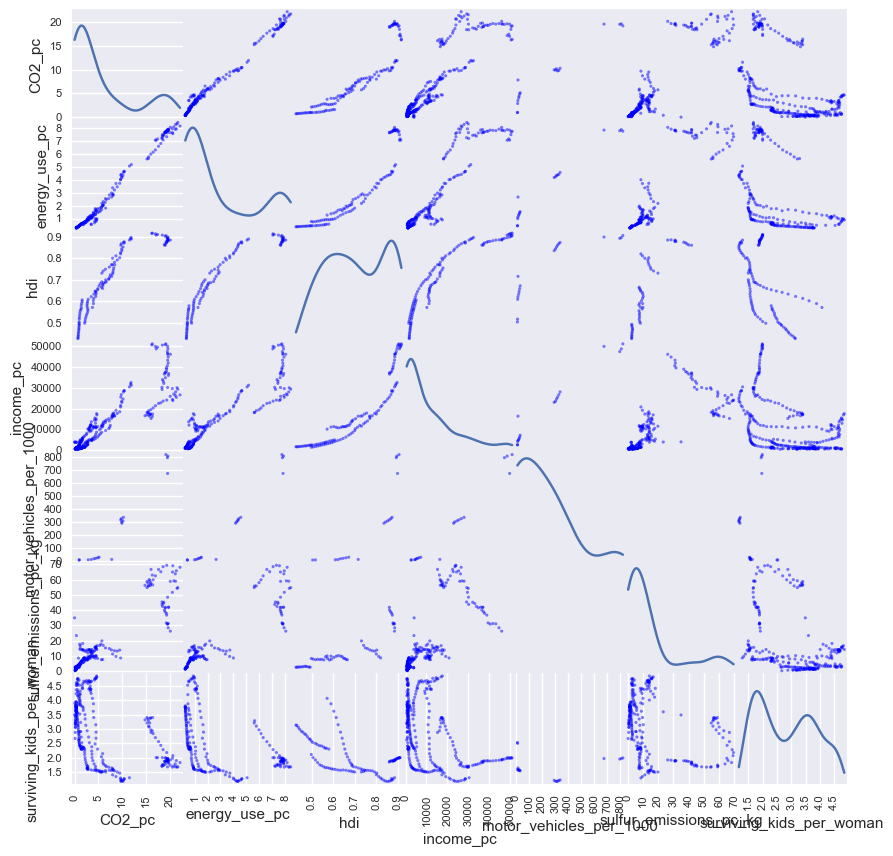

In [444]:
# wo
#sns.pairplot(pp_df, dropna=True);

q = "year >= 1950 & country in @top5_incr"
pp_df = df.query(q)[high_corr_var].astype('float')
pd.plotting.scatter_matrix(pp_df, alpha=0.5, diagonal='kde', figsize=(10,10));

In [778]:
# analyze with heatmap
q = "year == 2013"

hm_df = df.query(q).set_index('country').drop(['region', 'sub-region', 'year'], axis=1).sort_values(val)
#[high_corr_var]
normalized_df=(hm_df-hm_df.min())/(hm_df.max()-hm_df.min())
normalized_df.iplot(kind='heatmap', colorscale='YlOrRd', title=str.upper(q))

In [411]:
# correlations for top5 biggest CO2 footprint *decreases*

q = "year >= 1950 & country in @top5_decr"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                      1.000000
CO2_footprint               0.804583
energy_use_pc               0.755166
sulfur_emissions_pc_kg      0.751367
population                  0.685793
income_pc                   0.554293
motor_vehicles_per_1000     0.543044
roads_paved_%               0.368536
hdi                         0.156813
year                        0.117153
surviving_kids_per_woman   -0.341405
Name: CO2_pc, dtype: float64

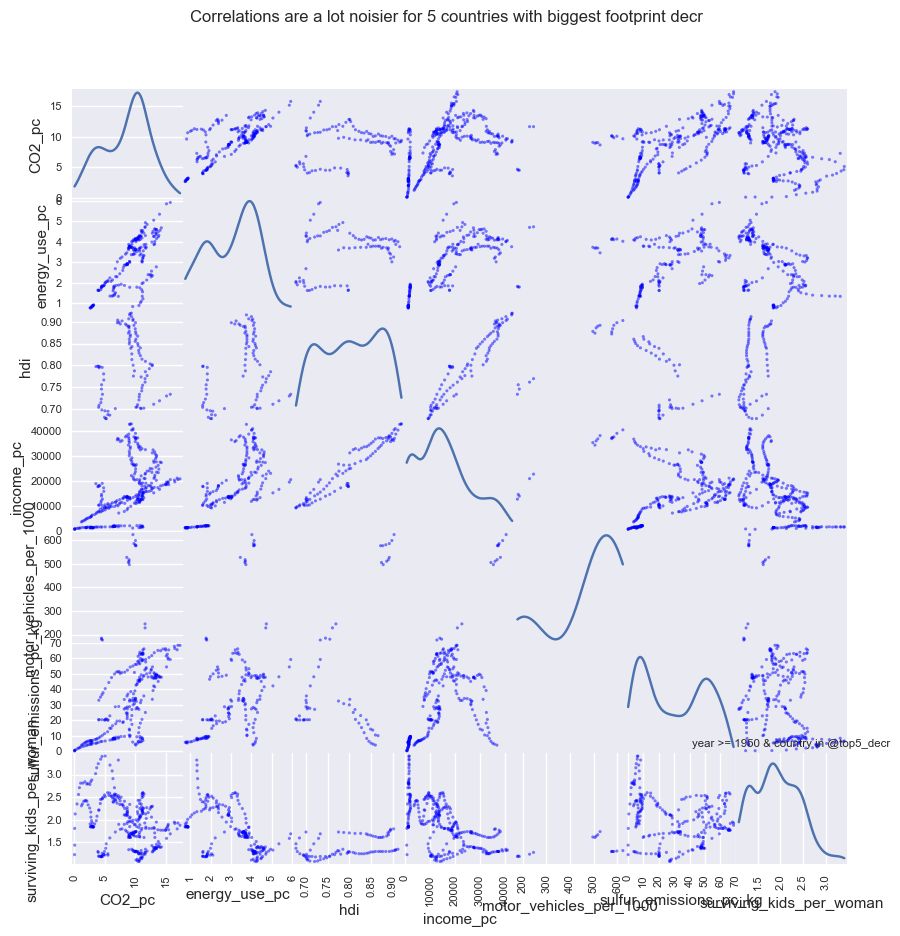

In [413]:
# scatter matrix for top 5 decr footprints
pp_df = df.query(q)[high_corr_var].astype('float')
pd.plotting.scatter_matrix(pp_df, alpha=0.5, diagonal='kde', figsize=(10,10))
plt.suptitle("Correlations are a lot noisier for 5 countries with biggest footprint decr")
plt.title(q, fontsize='x-small');

In [451]:
# analyze with heatmap
q = "year >= 1990 & country in @top5_decr"

# need shorter column names for legibility
def shorten_colnames(df, index_cols):
    cols=df.set_index(index_cols).columns
    colnames = pd.Series(cols).apply(str.split, args=('_')).apply(lambda x: x[0])
    colnames_dict = pd.Series(index=cols, data=colnames.values)\
        .to_dict()
    return colnames_dict

In [480]:
# create heatmap df
colname_dict = shorten_colnames(df.query(q), ['year'])
hm_df = df.query(q).set_index('year').drop(['region', 'sub-region', 'country'], axis=1)\
    .rename(columns=colname_dict)
hm_df.head()

,CO2,energy,hdi,income,motor,population,roads,sulfur,surviving,CO2
year,,,,,,,,,,
1950,0.23512,NaN,NaN,1920.0,NaN,1263171,NaN,0.407,4.00,296996.76552
1951,0.31327,NaN,NaN,2000.0,NaN,1287499,NaN,0.575,4.07,403334.81173
1952,0.28418,NaN,NaN,2010.0,NaN,1316086,NaN,0.630,4.26,374005.31948
1953,0.30735,NaN,NaN,2090.0,NaN,1348097,NaN,0.819,4.36,414337.61295
1954,0.36325,NaN,NaN,2150.0,NaN,1382881,NaN,1.090,4.51,502331.52325


In [482]:
# normalize & plot
normalized_df=(hm_df-hm_df.min())/(hm_df.max()-hm_df.min())
normalized_df.iplot(kind='heatmap', colorscale='YlOrRd', title=str.upper(q))

ValueError: cannot reindex from a duplicate axis

In [36]:
# what are the correlations for each region?
corr_df = df.query(q).groupby('region').corr().unstack()[val]
#corr_df.style.apply(highlight_max)
corr_df

,CO2_footprint,CO2_pc,energy_use_pc,hdi,income_pc,motor_vehicles_per_1000,population,roads_paved_%,sulfur_emissions_pc_kg,surviving_kids_per_woman,year
region,,,,,,,,,,,
Africa,0.587005,1.0,0.934227,0.682525,0.812310,0.844551,0.058021,0.397190,0.326261,-0.132718,0.172104
Americas,0.225701,1.0,0.980121,0.573191,0.751252,0.790540,0.145280,0.361015,0.684383,-0.423202,0.077153
Asia,0.001871,1.0,0.829998,0.567427,0.792595,0.657781,-0.100318,0.286768,0.120487,0.062155,0.126556
Europe,0.231958,1.0,0.722003,0.371574,0.435403,0.500786,0.128612,0.247517,0.414075,-0.244224,0.073157
Oceania,0.249290,1.0,0.942252,0.796689,0.891031,0.756500,0.213651,0.542631,0.936428,-0.752673,-0.015073


In [37]:
mask_lower = abs(corr_df) < .6 # hide weak correlations
corr_df.mask(mask_lower)

,CO2_footprint,CO2_pc,energy_use_pc,hdi,income_pc,motor_vehicles_per_1000,population,roads_paved_%,sulfur_emissions_pc_kg,surviving_kids_per_woman,year
region,,,,,,,,,,,
Africa,NaN,1.0,0.934227,0.682525,0.812310,0.844551,NaN,NaN,NaN,NaN,NaN
Americas,NaN,1.0,0.980121,NaN,0.751252,0.790540,NaN,NaN,0.684383,NaN,NaN
Asia,NaN,1.0,0.829998,NaN,0.792595,0.657781,NaN,NaN,NaN,NaN,NaN
Europe,NaN,1.0,0.722003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Oceania,NaN,1.0,0.942252,0.796689,0.891031,0.756500,NaN,NaN,0.936428,-0.752673,NaN


In [38]:
# how much do these correlations vary by region?
corr_df.std().sort_values()

CO2_pc                      0.000000
year                        0.069847
energy_use_pc               0.105224
roads_paved_%               0.114572
population                  0.119452
motor_vehicles_per_1000     0.135324
hdi                         0.157671
income_pc                   0.175820
CO2_footprint               0.209545
surviving_kids_per_woman    0.309162
sulfur_emissions_pc_kg      0.318590
dtype: float64

In [443]:
# get cols where at least 1 region 
# has corr > .6 or < -.6
high_corr_var = corr_df.mask(mask_lower).dropna(how='all', axis=1).columns.values.tolist()
high_corr_var

['CO2_pc',
 'energy_use_pc',
 'hdi',
 'income_pc',
 'motor_vehicles_per_1000',
 'sulfur_emissions_pc_kg',
 'surviving_kids_per_woman']

In [1308]:
def correlate_this(df, val):
    '''returns a correlation
    matrix for va'''
    corr_df = df.corr().unstack()[val].drop(val, axis=1)
    mask_lower = abs(corr_df) < .6 # hide weak correlations
    print "ALL CORRELATIONS:"
    print corr_df
    print "\n"
    print "GREATER THAN 0.6:"
    print corr_df.mask(mask_lower).dropna(how='all', axis=1)
   
    return corr_df
        
grp_df = df.groupby(['region'])
corr_df = correlate_this(grp_df, val)


ALL CORRELATIONS:
          energy_use_pc       hdi  income_pc  motor_vehicles_per_1000  \
region                                                                  
Africa         0.934227  0.682525   0.806231                 0.844551   
Americas       0.980121  0.573191   0.696598                 0.790540   
Asia           0.829998  0.567427   0.713503                 0.657781   
Europe         0.722003  0.371574   0.646132                 0.500786   
Oceania        0.942252  0.796689   0.887056                 0.756500   

          population  roads_paved_%  sulfur_emissions_pc_kg  \
region                                                        
Africa      0.063690       0.397190                0.268735   
Americas    0.158243       0.361015                0.689718   
Asia       -0.068532       0.286768                0.196756   
Europe      0.304520       0.247517                0.642906   
Oceania     0.222089       0.542631                0.874225   

          surviving_kids_per

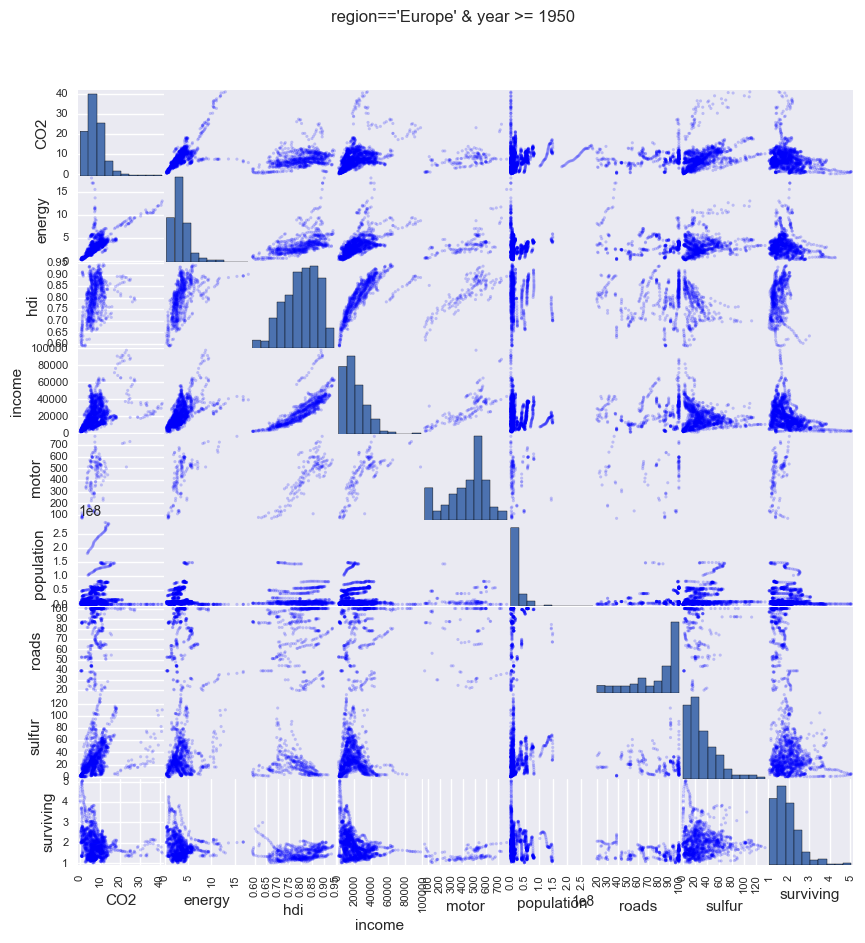

In [475]:
# plot scatter matrix
from pandas.plotting import scatter_matrix

# variables
q = "region=='Europe' & year >= 1950"
idx =  ['year', 'CO2footprint']

# shorten column names for legibility in scatter matrix
colnames_dict = shorten_colnames(df.query(q), idx)
sm_df = df.query(q).set_index(idx).rename(columns = colnames_dict)

# plot
scatter_matrix(sm_df, figsize=(10,10), alpha=0.2, grid=True)
plt.suptitle(q);

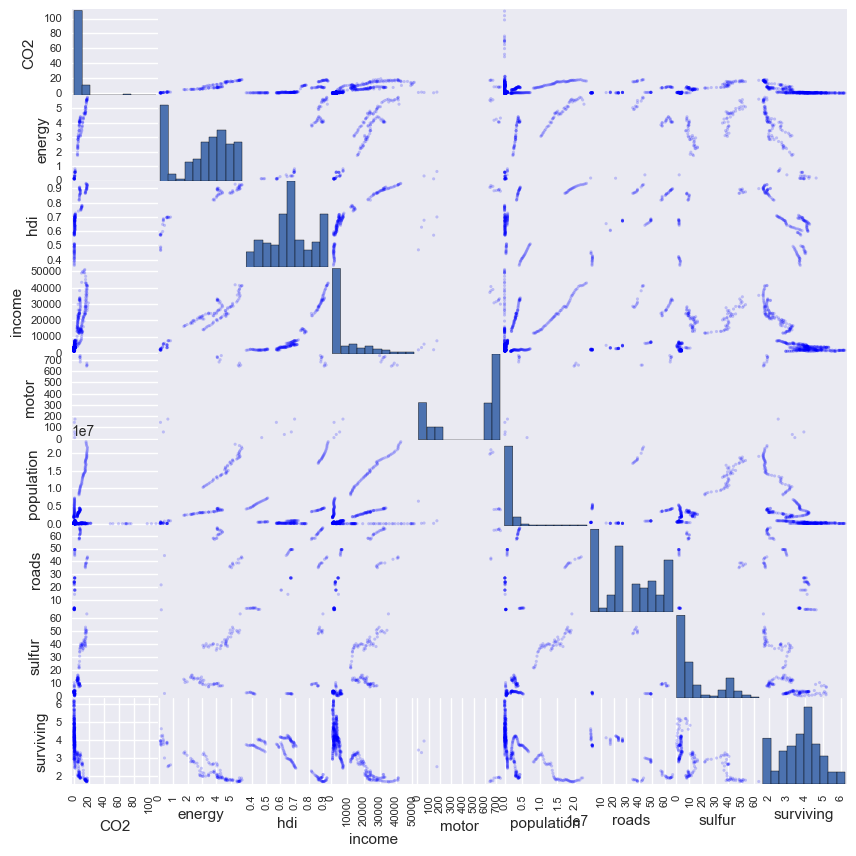

In [1156]:
# compare with other regions

#subset = df['region']=='Asia'
q = "year >= 1950 & region=='Oceania'"
#sm_df = df.query(q).loc[subset].set_index(['year', 'CO2footprint']).rename(columns = colnames_dict['columns'])

sm_df = df.query(q).set_index(['year', 'CO2footprint']).rename(columns = colnames_dict['columns'])

scatter_matrix(sm_df, figsize=(10,10), alpha=0.2, grid=True);

In [ ]:
# correlations by region
df.query(q).groupby('region').corr()[val].unstack().T\
.drop(['year','CO2footprint', val]).style.apply(highlight_max)

In [ ]:
corr_df = df.groupby('region').corr()[val].unstack().T\
.drop(['year','CO2footprint', val])

#corr_df.style.apply(color_negative_red, axis=1)
mask = corr_df.style.applymap(color_negative_red)
mask

### Observations

#### Energy, then Income have highest correlation with CO2 p.c. emissions

Motor vehicle ownership & HDI also show strong correlations. 
Kids surviving to 35 have a moderate negative correlation overall, and a strong negative correlation for Oceania.

Another exception for Oceania is sulfur emissions: it has the highest correlation with CO2 emissions for Oceania, whereas it is small everwhere else.

But to what extent are HDI scores, vehicle ownership, and surviving kids (i.e. family size) just proxies for income? 

## Is there a lot of variation in correlations within regions?

In [ ]:
# further break down CO2 correlation matrix by sub_region
co2_corr = df.query(q).groupby(['region', 'sub-region']).corr()[val]
co2_corr = co2_corr.unstack(level=(0,1))

co2_corr

### Observations
In North America, Family Size (Surviving Kids) has a positive correlation
There are fascinating descrepancies within the regions as well.

For example, North America is the only sub_region in the world where the more adult children in a family, the higher the per capita CO2 emissions.

Another unique exception in N. America: Energy has an exceptionally low correlation. But the correlation with motor vehicle ownership & % roads paved is the highest in the Americas.

## Are the regional breakdowns too arbitrary?

In some regions, there are 'gorillas' that could skew the numbers, such as the US in the Americas, or Australia for Oceania.

Looking at the bubble plots, in each region there seems to be an invisible line dividing a few high-income/energy/CO2 emitting countries from the mass of countries clustered in the bottom left.

In other words, do the 'have' countries emit CO2 for different reasons than the have-not countries, regardless of where they are located?

In [291]:
# select columns to use in plots
plot_cols = [col for col in df.columns[5:-1]]
plot_cols

['energy_use_pc',
 'hdi',
 'income_pc',
 'motor_vehicles_per_1000',
 'population',
 'roads_paved_%',
 'sulfur_emissions_pc_kg',
 'surviving_kids_per_woman']

In [977]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16677 entries, 0 to 17054
Data columns (total 14 columns):
country                     16677 non-null object
region                      16677 non-null object
sub-region                  16677 non-null object
year                        16677 non-null int64
CO2_pc                      16677 non-null float64
energy_use_pc               5324 non-null float64
hdi                         3898 non-null float64
income_pc                   14969 non-null float64
motor_vehicles_per_1000     456 non-null float64
population                  16677 non-null int64
roads_paved_%               1977 non-null float64
sulfur_emissions_pc_kg      11230 non-null float64
surviving_kids_per_woman    13919 non-null float64
CO2footprint                16677 non-null float64
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


In [429]:
# plot d col against CO2_pc
# bubbles color-coded by HDI level
q = "year >= 1950"
yr = last_valid
y = 'CO2_log'
x = 'hdi'
size= 'population'
#cat_col = 'income_pc'
#plot_df = pd.concat([df.query(q), log_co2], axis=1)
#plot_bubble(plot_df, x, 'region')
log_co2 = df.query(q)['CO2_pc'].apply(np.log).replace([np.inf, -np.inf], np.nan)\
    .rename('log_co2')
    
idx = ['region','country', 'year']
pp_df = pd.concat([df.query(q), log_co2], axis=1).set_index(idx)[[val, 'hdi']]\
    .reset_index(['region','country'])\
    .sort_values('region')
    


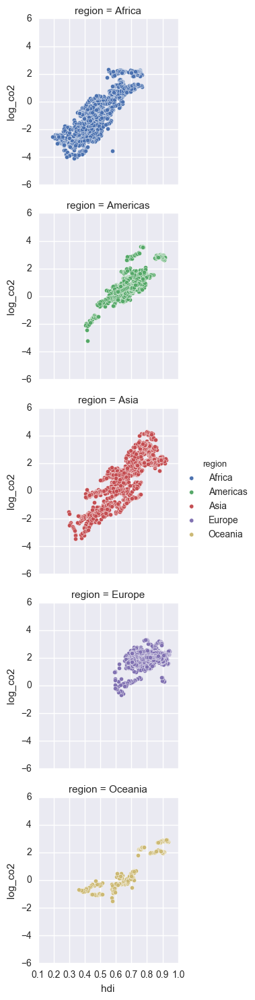

In [430]:
g = sns.FacetGrid(pp_df, row="region",  hue="region")
g = (g.map(plt.scatter, "hdi", val, edgecolor="w")\
     .add_legend())


In [293]:
# plot d col against CO2_pc
# bubbles color-coded by HDI level
for col in plot_cols:
    last_valid = df['year'].loc[df[col].last_valid_index()] # last non-null year for col
    q = "year == @last_valid"
    yr = last_valid
    y = 'CO2_pc'
    x = col
    size= 'population'
    cat_col = 'income_pc'
    make_cuts = True
    plot_bubble_with_cuts(df.query(q), col, cat_col)
    #plot_bubble(df.query(q), col, 'region')
    

In [1165]:
# compare on income levels
(q) = 'year==@end_yr'
x = 'income_pc'
y = 'CO2_pc'
size = 'CO2footprint'
cat_col = 'hdi'

plot_bubble_with_cuts(df.query((q)), cat_col)

TypeError: cannot concatenate 'str' and 'float' objects

In [ ]:
# look at the distributions by HDI level

# reshape so region, sub_region & CO2 are columns
#df_box = df.sort_values('hdi_level').set_index(['hdi_level', 'country'])['CO2']
#df_box.reset_index('country').boxplot(by='hdi_level', showfliers=False);

In [416]:
# Create x, where x the 'scores' column's values as floats
x = df[[val]].values.astype(float)

# Create a minimum and maximum processor object
min_max_scaler = preprocessing.MinMaxScaler()

# Create an object to transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

df_normalized = pd.DataFrame(x_scaled)

In [881]:
q = "year == 2013" # Kyoto Accord for Reduction of Greenhouse gases signed in Dec 1997
valcols = df.columns[4:-1]

for region in df['region'].unique():   
    hm_df = df.query(q).loc[df['region']==region].set_index('country')[valcols]
    normalized_df=(hm_df-hm_df.min())/(hm_df.max()-hm_df.min())
    normalized_df.sort_values(val).iplot(kind='heatmap', colorscale='YlOrRd', title=str.upper(region))

KeyError: 'region'

# Conclusions

## CO2 analysis

* Not surprisingly, per capita CO2 emissions are usually highly correlated with per capita income & energy consumption, and to a lesser extent, motor vehicle ownership & HDI score.

* There were intriguing outliers in Europe, all tiny countries: Luxembourg, Faroe Islands, Gibraltar & Estonia. Several Carribean countries had very high CO2 p.c. emissions. Some avenues worth exploring:
    * Is this because their tiny size forces them to import most goods? 
    * Many of these countries are quite wealthy. More flights taken? Higher yacht ownership? 


## Multi-variate analysis
* For multi-variate analysis, regional (continents) comparisions almost useless: too much noise within regions due to extreme outliers and unequal distribution of (wealthy) countries within sub-regions. Prime examples:
    * Americas: Northern Americas,  
    * Oceania:  Australia & New Zealand
    * Asia: Western Asia, which includes most of the OPEC countries
* Instead, segmenting by HDI level revealed interesting patterns in scatterplots of CO2 vs Surviving Kids - negatively correlated except for High or Very High HDI groups.


